In [1]:
# Importar las librerías necesarias
import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt  
import seaborn as sns  
from pathlib import Path
import glob
import time

from sklearn.preprocessing import StandardScaler 
from sklearn.decomposition import PCA  
from sklearn.cluster import KMeans



In [2]:
# Establecer el random seed
random_seed = 42
np.random.seed(random_seed)

# Cargar y Explorar los Datos
Carga el archivo parquet usando pandas y realiza una exploración inicial de los datos, incluyendo estadísticas descriptivas y visualización de distribuciones.

In [3]:
# Cargar todos los archivos parquet que contienen 'merged_inmuebles24_departamentos_duckdb'
data_folder = '../../data/processed/'
pattern = f"{data_folder}*merged_inmuebles24_departamentos_duckdb*.parquet"

In [4]:

# Buscar todos los archivos que coincidan con el patrón
files = glob.glob(pattern)


In [5]:

print(f"Archivos encontrados: {len(files)}")
for file in files:
    print(f"  - {Path(file).name}")


Archivos encontrados: 6
  - merged_inmuebles24_departamentos_duckdb_2025-10-11.parquet
  - merged_inmuebles24_departamentos_duckdb_2025-08-31.parquet
  - merged_inmuebles24_departamentos_duckdb_2025-09-27.parquet
  - merged_inmuebles24_departamentos_duckdb_2025-10-05.parquet
  - merged_inmuebles24_departamentos_duckdb_2025-09-14.parquet
  - merged_inmuebles24_departamentos_duckdb_2025-09-20.parquet


In [6]:

# Leer y concatenar todos los archivos
if len(files) == 0:
    raise FileNotFoundError(f"No se encontraron archivos con el patrón: {pattern}")


In [7]:

dfs = []
for file in files:
    temp_df = pd.read_parquet(file)
    temp_df['source_file'] = Path(file).name  # Agregar columna con nombre del archivo fuente
    dfs.append(temp_df)
    print(f"Cargado: {Path(file).name} - {len(temp_df)} registros")


Cargado: merged_inmuebles24_departamentos_duckdb_2025-10-11.parquet - 5975 registros
Cargado: merged_inmuebles24_departamentos_duckdb_2025-08-31.parquet - 5858 registros
Cargado: merged_inmuebles24_departamentos_duckdb_2025-09-27.parquet - 5986 registros
Cargado: merged_inmuebles24_departamentos_duckdb_2025-10-05.parquet - 5843 registros
Cargado: merged_inmuebles24_departamentos_duckdb_2025-09-14.parquet - 6040 registros
Cargado: merged_inmuebles24_departamentos_duckdb_2025-09-20.parquet - 5684 registros


In [8]:
# Concatenar todos los DataFrames
df = pd.concat(dfs, ignore_index=True)

In [9]:
df.shape

(35386, 155)

### Análisis de duplicados

In [10]:
# Contar duplicados completos (todas las columnas)
duplicados_completos = df.duplicated().sum()
print(f"\n1. Duplicados completos (todas las columnas): {duplicados_completos}")
print(f"   Porcentaje: {(duplicados_completos/len(df)*100):.2f}%")



1. Duplicados completos (todas las columnas): 0
   Porcentaje: 0.00%


In [11]:
# Identificar columnas clave para duplicados (excluyendo source_file)
cols_clave = [col for col in df.columns if col != 'source_file']
cols_clave


['precio_mxn',
 'lote_m2',
 'recamaras',
 'baños',
 'estacionamiento',
 'es_amueblado',
 'es_penthouse',
 'direccion',
 'colonia',
 'cp',
 'municipio',
 'Título',
 'Enlace',
 'latitud',
 'longitud',
 'colonia_std',
 'ENTIDAD',
 'NOM_ENT',
 'MUN',
 'NOM_MUN',
 'LOC',
 'NOM_LOC',
 'AGEB',
 'MZA',
 'POBTOT',
 'POBFEM',
 'POBMAS',
 'P_0A2',
 'P_0A2_F',
 'P_0A2_M',
 'P_18YMAS',
 'P_18YMAS_F',
 'P_18YMAS_M',
 'P_3A5',
 'P_3A5_F',
 'P_3A5_M',
 'P_6A11',
 'P_6A11_F',
 'P_6A11_M',
 'P_8A14',
 'P_8A14_F',
 'P_8A14_M',
 'P_12A14',
 'P_12A14_F',
 'P_12A14_M',
 'P_15A17',
 'P_15A17_F',
 'P_15A17_M',
 'P_18A24',
 'P_18A24_F',
 'P_18A24_M',
 'P_15A49_F',
 'P_60YMAS',
 'P_60YMAS_F',
 'P_60YMAS_M',
 'POB65_MAS',
 'P18YM_PB',
 'P18YM_PB_F',
 'P18YM_PB_M',
 'TOTHOG',
 'HOGJEF_F',
 'HOGJEF_M',
 'POBHOG',
 'PHOGJEF_F',
 'PHOGJEF_M',
 'VIVTOT',
 'TVIVHAB',
 'TVIVPAR',
 'VIVPAR_HAB',
 'VIVPARH_CV',
 'TVIVPARHAB',
 'VIVPAR_DES',
 'VIVPAR_UT',
 'OCUPVIVPAR',
 'PROM_OCUP',
 'PRO_OCUP_C',
 'VPH_1DOR',
 'VPH_2YMA

In [12]:
# Duplicados por columnas clave
duplicados_clave = df.duplicated(subset=cols_clave).sum()
print(f"\n2. Duplicados por columnas clave (excluyendo source_file): {duplicados_clave}")
print(f"   Porcentaje: {(duplicados_clave/len(df)*100):.2f}%")



2. Duplicados por columnas clave (excluyendo source_file): 13951
   Porcentaje: 39.43%


In [13]:
# Si hay duplicados, mostrar ejemplos
if duplicados_clave > 0:
    print("\n3. Ejemplos de registros duplicados:")
    mask_duplicados = df.duplicated(subset=cols_clave, keep=False)
    ejemplos_duplicados = df[mask_duplicados].sort_values(by=cols_clave[:3]).head(10)
    display(ejemplos_duplicados[['precio_mxn', 'lote_m2', 'direccion', 'source_file'][:min(5, len(ejemplos_duplicados.columns))]])
    
    # Contar duplicados por archivo fuente
    print("\n4. Distribución de duplicados por archivo fuente:")
    duplicados_por_archivo = df[mask_duplicados].groupby('source_file').size().sort_values(ascending=False)
    print(duplicados_por_archivo)



3. Ejemplos de registros duplicados:


,precio_mxn,lote_m2,direccion,source_file
12479,2900.0,30,jardin azaleas jardines de san lorenzo tezonco...,merged_inmuebles24_departamentos_duckdb_2025-0...
25286,2900.0,30,jardin azaleas jardines de san lorenzo tezonco...,merged_inmuebles24_departamentos_duckdb_2025-0...
31143,2900.0,30,jardin azaleas jardines de san lorenzo tezonco...,merged_inmuebles24_departamentos_duckdb_2025-0...
1409,2950.0,12,calle tepexpan la candelaria coyoacan,merged_inmuebles24_departamentos_duckdb_2025-1...
7647,2950.0,12,calle tepexpan la candelaria coyoacan,merged_inmuebles24_departamentos_duckdb_2025-0...
13006,2950.0,12,calle tepexpan la candelaria coyoacan,merged_inmuebles24_departamentos_duckdb_2025-0...
18554,2950.0,12,calle tepexpan la candelaria coyoacan,merged_inmuebles24_departamentos_duckdb_2025-1...
24899,2950.0,12,calle tepexpan la candelaria coyoacan,merged_inmuebles24_departamentos_duckdb_2025-0...
31218,2950.0,12,calle tepexpan la candelaria coyoacan,merged_inmuebles24_departamentos_duckdb_2025-0...
1204,3000.0,16,sur gabriel ramos millan seccion bramadero iz...,merged_inmuebles24_departamentos_duckdb_2025-1...



4. Distribución de duplicados por archivo fuente:
source_file
merged_inmuebles24_departamentos_duckdb_2025-09-20.parquet    3926
merged_inmuebles24_departamentos_duckdb_2025-09-27.parquet    3892
merged_inmuebles24_departamentos_duckdb_2025-09-14.parquet    3702
merged_inmuebles24_departamentos_duckdb_2025-10-05.parquet    3628
merged_inmuebles24_departamentos_duckdb_2025-10-11.parquet    3022
merged_inmuebles24_departamentos_duckdb_2025-08-31.parquet    2604
dtype: int64


In [14]:
# Eliminar duplicados si existen
if duplicados_clave > 0:
    print(f"\n5. Eliminando {duplicados_clave} duplicados...")
    df_original_len = len(df)
    df = df.drop_duplicates(subset=cols_clave, keep='first')
    print(f"   Registros antes: {df_original_len}")
    print(f"   Registros después: {len(df)}")
    print(f"   Registros eliminados: {df_original_len - len(df)}")


5. Eliminando 13951 duplicados...
   Registros antes: 35386
   Registros después: 21435
   Registros eliminados: 13951


### Análisis de Nulos

In [15]:
# Contar nulos por columna
nulos_por_columna = df.isnull().sum().sort_values(ascending=False)
porcentaje_nulos = (nulos_por_columna / len(df) * 100).round(2)

In [16]:
# Crear DataFrame de resumen
resumen_nulos = pd.DataFrame({
    'Valores_Nulos': nulos_por_columna,
    'Porcentaje': porcentaje_nulos,
    'Tipo_Dato': df.dtypes
})

In [17]:
# Filtrar solo columnas con nulos
resumen_nulos_con_datos = resumen_nulos[resumen_nulos['Valores_Nulos'] > 0]

print(f"\n1. Resumen general:")
print(f"   Total de columnas: {len(df.columns)}")
print(f"   Columnas con nulos: {len(resumen_nulos_con_datos)}")
print(f"   Columnas sin nulos: {len(df.columns) - len(resumen_nulos_con_datos)}")


1. Resumen general:
   Total de columnas: 155
   Columnas con nulos: 141
   Columnas sin nulos: 14


In [18]:
# Exploración inicial de los datos
# Mostrar las primeras filas del DataFrame
print("Primeras filas del DataFrame:")
df.head()


Primeras filas del DataFrame:


,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,address,road,quarter,borough,postcode,longitud_1,latitud_1,neighbourhood,distancia,source_file
0,18000.0,130,2.0,1.0,1.0,0,0,rio becerra 135 8 de agosto benito juarez,8 de agosto,1180,...,"{'road': 'Calle Martell', 'neighbourhood': 'Co...",Calle Martell,None,Álvaro Obregón,01180,-99.189077,19.394770,8 de agosto,0.008476,merged_inmuebles24_departamentos_duckdb_2025-1...
1,30000.0,198,2.0,2.0,2.0,0,0,avenida rio mixcoac 206 acacias benito juarez,acacias,3240,...,"{'road': 'Calle 1', 'neighbourhood': 'Colonia ...",Calle 1,None,Benito Juárez,03240,-99.175132,19.363520,acacias,0.000234,merged_inmuebles24_departamentos_duckdb_2025-1...
2,23500.0,110,2.0,2.0,1.0,1,0,av. san francisco col. del valle actipan ben...,actipan,3230,...,"{'road': 'José María Rico', 'neighbourhood': '...",José María Rico,None,Benito Juárez,03240,-99.176422,19.368233,actipan,0.000330,merged_inmuebles24_departamentos_duckdb_2025-1...
3,14000.0,59,2.0,1.0,1.0,0,0,calle 2 agricola pantitlan iztacalco,agricola pantitlan,8100,...,"{'house_number': '116', 'road': 'Calle 2', 'ne...",Calle 2,None,Iztacalco,08100,-99.067143,19.409103,agricola pantitlan,0.000125,merged_inmuebles24_departamentos_duckdb_2025-1...
4,14000.0,30,1.0,1.0,1.0,1,0,av. tamaulipas 257 alvaro obregon ciudad de m...,alvaro obregon,9230,...,"{'road': 'Avenida Congreso de la Unión', 'neig...",Avenida Congreso de la Unión,None,Venustiano Carranza,15990,-99.121470,19.412086,alvaro obregon,0.153109,merged_inmuebles24_departamentos_duckdb_2025-1...


In [19]:
if len(resumen_nulos_con_datos) > 0:
    print(f"\n2. Top 20 columnas con más valores nulos:")
    display(resumen_nulos_con_datos.head(20))
    


2. Top 20 columnas con más valores nulos:


,Valores_Nulos,Porcentaje,Tipo_Dato
AGEB,1892,8.83,object
AGEB_fm,1892,8.83,object
CVEFT,1892,8.83,object
CVEREF1,1892,8.83,object
CVEREF2,1892,8.83,object
CVEREF3,1892,8.83,object
CVESEG,1892,8.83,object
CVESEG1,1892,8.83,object
CVESEG2,1892,8.83,object
CVESEG3,2183,10.18,object


In [20]:
df[df.AGEB.isnull()].head(10)

,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,address,road,quarter,borough,postcode,longitud_1,latitud_1,neighbourhood,distancia,source_file
5238,15000.0,63,1.0,1.0,2.0,0,0,cerrada de escuela superior de guerra 81 san j...,san jeronimo lidice,10200,...,None,None,None,None,None,NaN,NaN,None,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...
5239,16000.0,80,3.0,2.0,1.0,1,0,privada escuela superior de guerra san jeronim...,san jeronimo lidice,10200,...,None,None,None,None,None,NaN,NaN,None,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...
5240,26000.0,161,2.0,2.0,2.0,0,0,av. conteras 643 san jeronimo lidice la magda...,san jeronimo lidice,10200,...,None,None,None,None,None,NaN,NaN,None,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...
5241,10000.0,15,1.0,1.0,1.0,1,0,privada de antonia san jeronimo lidice la mag...,san jeronimo lidice,10200,...,None,None,None,None,None,NaN,NaN,None,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...
5242,22000.0,80,3.0,2.0,2.0,0,0,270 av mexico contreras san jeronimo lidice l...,san jeronimo lidice,10200,...,None,None,None,None,None,NaN,NaN,None,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...
5243,16000.0,100,4.0,1.0,1.0,0,0,av. tlahuac pueblo culhuacan iztapalapa,culhuacan,9800,...,None,None,None,None,None,NaN,NaN,None,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...
5244,85000.0,325,3.0,3.0,2.0,0,0,avenida emilio castelar polanco iv seccion po...,polanco iv seccion,11550,...,None,None,None,None,None,NaN,NaN,None,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...
5245,45000.0,125,2.0,2.0,0.0,0,0,av. emilio castelar polanco iv seccion polanco,polanco iv seccion,11550,...,None,None,None,None,None,NaN,NaN,None,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...
5246,45000.0,125,2.0,2.0,0.0,0,0,avenida emilio castelar polanco iv seccion po...,polanco iv seccion,11550,...,None,None,None,None,None,NaN,NaN,None,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...
5247,175000.0,345,2.0,2.0,2.0,1,0,solon polanco ii seccion polanco,polanco ii seccion,11530,...,None,None,None,None,None,NaN,NaN,None,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...


In [21]:
df = df.dropna(subset=['AGEB'])

In [22]:
df.shape

(19543, 155)

In [23]:
df.isnull().sum().sort_values(ascending=False)

quarter        19494
longitud        7498
latitud         7498
distancia       7498
TIPOVR3          291
               ...  
P_60YMAS_F         0
P_60YMAS_M         0
POB65_MAS          0
P18YM_PB           0
source_file        0
Length: 155, dtype: int64

In [24]:
df = df.drop_duplicates(subset=['Título'])

In [25]:
df = df.dropna(subset=['latitud', 'longitud'])

In [26]:
df.shape

(8291, 155)

In [27]:
df.isnull().sum().sort_values(ascending=False)

quarter        8262
CVEVIAL3        117
CVESEG3         117
TIPOVR3         117
NOMREF3         117
               ... 
P_60YMAS          0
P_60YMAS_F        0
P_60YMAS_M        0
POB65_MAS         0
source_file       0
Length: 155, dtype: int64

In [28]:
# Información general del DataFrame
print("\nInformación general del DataFrame:")
df.info()


Información general del DataFrame:
<class 'pandas.core.frame.DataFrame'>
Index: 8291 entries, 0 to 33886
Columns: 155 entries, precio_mxn to source_file
dtypes: Int64(1), float64(11), int64(2), object(141)
memory usage: 9.9+ MB


In [29]:
obj_cols = ['direccion','colonia','cp','neighbourhood','Título','Enlace','colonia_std','municipio',
            'ENTIDAD', 'NOM_ENT', 'MUN', 'NOM_MUN', 'LOC', 'NOM_LOC', 'AGEB', 'MZA',
            'key', 'ENTIDAD_fm', 'MUN_fm', 'LOC_fm', 'AGEB_fm',
            'MZA_fm', 'CVEVIAL', 'CVESEG', 'CVEFT', 'NOMVIAL', 'TIPOVIAL',
            'CVEVIAL1', 'CVESEG1', 'CVEREF1', 'TIPOVR1', 'NOMREF1', 'CVEVIAL2',
            'CVESEG2', 'CVEREF2', 'TIPOVR2', 'NOMREF2', 'CVEVIAL3', 'CVESEG3',
            'CVEREF3', 'TIPOVR3', 'NOMREF3', 'municipio_1', 'address', 'road',
            'quarter', 'borough', 'postcode', 'neighbourhood', 'source_file', 
            'lon', 'lat','latitud_1', 'longitud_1','distancia','latitud','longitud']

In [30]:
target = ['precio_mxn']

In [31]:
numeric_cols = list(set(df.columns) - set(obj_cols) - set(target))

In [32]:
df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors='coerce')

In [33]:
fix_int = list(df.select_dtypes('Int64').columns)

In [34]:
fix_int

['lote_m2', 'es_amueblado', 'es_penthouse', 'POBTOT', 'VIVTOT', 'TVIVHAB']

In [35]:
df[df['lote_m2'].isnull()].source_file.value_counts()

source_file
merged_inmuebles24_departamentos_duckdb_2025-10-11.parquet    24
merged_inmuebles24_departamentos_duckdb_2025-08-31.parquet    16
merged_inmuebles24_departamentos_duckdb_2025-09-27.parquet     5
merged_inmuebles24_departamentos_duckdb_2025-09-14.parquet     4
merged_inmuebles24_departamentos_duckdb_2025-10-05.parquet     1
merged_inmuebles24_departamentos_duckdb_2025-09-20.parquet     1
Name: count, dtype: int64

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8291 entries, 0 to 33886
Columns: 155 entries, precio_mxn to source_file
dtypes: Int64(1), float64(100), int64(5), object(49)
memory usage: 9.9+ MB


In [37]:
# Estadísticas descriptivas
print("\nEstadísticas descriptivas:")
df.describe(include='all')


Estadísticas descriptivas:


,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,address,road,quarter,borough,postcode,longitud_1,latitud_1,neighbourhood,distancia,source_file
count,8291.000000,8240.0,8291.000000,8291.000000,8291.000000,8291.000000,8291.000000,8291,8291,8291,...,8291,8204,29,8291,8291,8291.000000,8291.000000,8291,8291.000000,8291
unique,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,4529,294,269,...,1183,801,4,15,305,NaN,NaN,290,NaN,6
top,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,polanco polanco miguel hidalgo,hidalgo,1120,...,"{'amenity': 'Colegio Americano', 'road': 'Call...",Calle Tula,Tlatelolco,Álvaro Obregón,01120,NaN,NaN,hidalgo,NaN,merged_inmuebles24_departamentos_duckdb_2025-1...
freq,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,93,2518,2529,...,2283,2283,16,3508,2526,NaN,NaN,2518,NaN,3756
mean,37221.490040,280.896723,1.983717,1.753829,1.348330,0.294898,0.041370,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-99.188927,19.397808,NaN,0.058364,NaN
std,29561.065994,10544.676025,0.902269,0.792803,0.881524,0.456024,0.199157,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.041907,0.033693,NaN,0.501071,NaN
min,12.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-99.304810,19.206014,NaN,0.000005,NaN
25%,19518.000000,64.0,1.000000,1.000000,1.000000,0.000000,0.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-99.206255,19.376291,NaN,0.000794,NaN
50%,29000.000000,90.0,2.000000,2.000000,1.000000,0.000000,0.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-99.182552,19.400303,NaN,0.008628,NaN
75%,43000.000000,138.0,2.000000,2.000000,2.000000,1.000000,0.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-99.163803,19.423057,NaN,0.034894,NaN


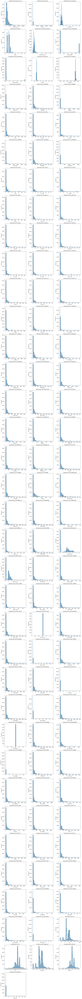

In [38]:
# Visualización de distribuciones
# Seleccionar columnas numéricas
numeric_columns = df.select_dtypes(include=[np.number]).columns

# Crear subplots para las columnas numéricas
num_cols = len(numeric_columns)
fig, axes = plt.subplots(nrows=(num_cols // 3) + 1, ncols=3, figsize=(15, 5 * ((num_cols // 3) + 1)))
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.histplot(df[column], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"Distribución de {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Frecuencia")

# Eliminar ejes vacíos si hay menos subplots que espacios
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

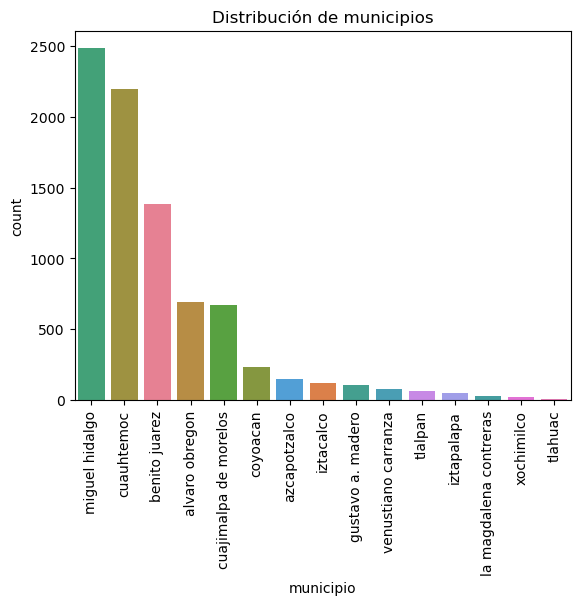

In [39]:
municipio_order = df['municipio'].value_counts().index

sns.countplot(data=df, x='municipio', order=municipio_order, hue='municipio')
plt.xticks(rotation=90)
plt.title('Distribución de municipios')
plt.show()

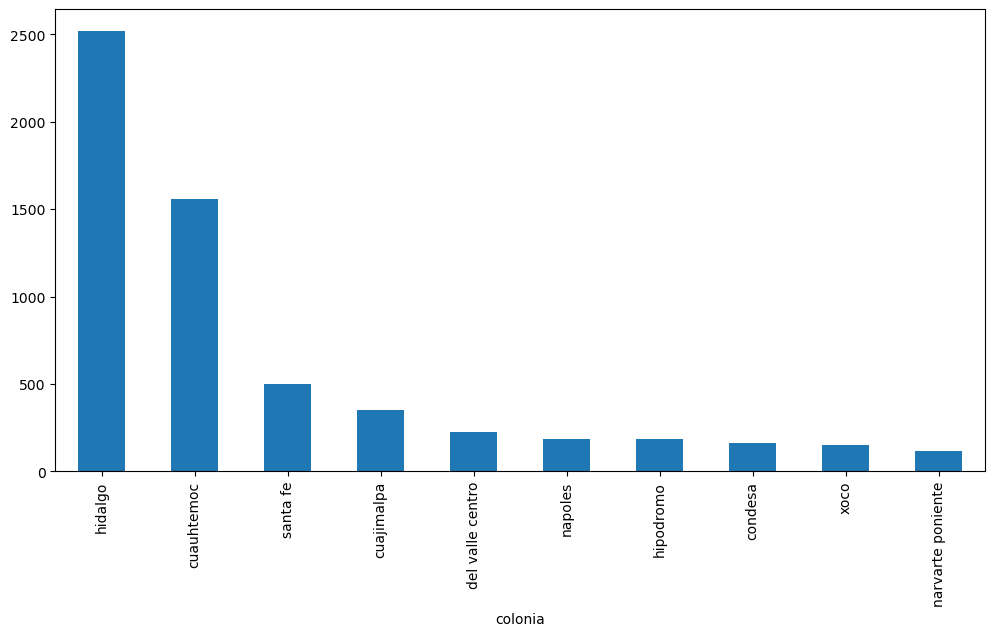

In [40]:
df.colonia.value_counts().head(10).plot(kind='bar', figsize=(12,6))
plt.show()

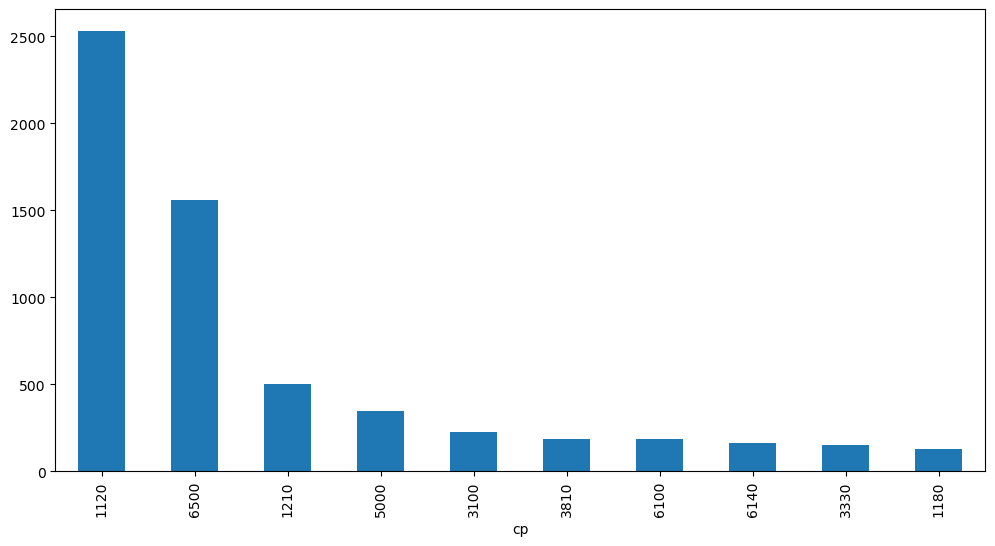

In [41]:
# Un CP puede contener varias colonias, así que nos quedamos sólo con colonias
df.cp.value_counts().head(10).plot(kind='bar', figsize=(12,6))
plt.show()

In [42]:
top10_cols= list(df.colonia.value_counts().head(10).index)

In [43]:
df['colonia_top10'] = df['colonia'].where(df['colonia'].isin(top10_cols), 'otros')

/var/folders/c7/mdvpp7_n2dj49y88d6cj51kc0000gn/T/ipykernel_12447/2711523768.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['colonia_top10'] = df['colonia'].where(df['colonia'].isin(top10_cols), 'otros')


# Preprocesamiento de Datos
Aplica técnicas de limpieza de datos, manejo de valores nulos y codificación de variables categóricas.

In [44]:
# Identificar valores nulos en el DataFrame
print("\nValores nulos por columna:")
df.isnull().sum().sort_values(ascending=False)


Valores nulos por columna:


quarter          8262
P_0A2_F          2148
P_3A5_M          1856
VPH_SINRTV       1760
P_12A14_F        1739
                 ... 
ENTIDAD_fm          0
MUN_fm              0
LOC_fm              0
AGEB_fm             0
colonia_top10       0
Length: 156, dtype: int64

In [45]:
# outliers
# Función para detectar outliers usando el método del rango intercuartílico (IQR) 
def detectar_outliers_iqr(data, columna):
    Q1 = data[columna].quantile(0.25)
    Q3 = data[columna].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    outliers = data[(data[columna] < limite_inferior) | (data[columna] > limite_superior)]
    return outliers


Número de outliers en P_18A24_M: 802
    P_18A24_M
1        20.0
2        31.0
10       34.0
12       22.0
51       20.0

Número de outliers en P_0A2: 561
    P_0A2
1    11.0
10   12.0
58   16.0
66   33.0
67   15.0

Número de outliers en VPH_1CUART: 1369
    VPH_1CUART
2          5.0
10        22.0
12         3.0
45        11.0
49         6.0

Número de outliers en TVIVPARHAB: 538
    TVIVPARHAB
1        234.0
2        220.0
10       176.0
17       215.0
66       315.0

Número de outliers en VPH_C_SERV: 537
    VPH_C_SERV
1        234.0
2        220.0
10       176.0
17       215.0
66       315.0

Número de outliers en VPH_S_ELEC: 0

Número de outliers en VPH_SINRTV: 836
    VPH_SINRTV
5          7.0
10         7.0
41         4.0
45         3.0
51         3.0

Número de outliers en P_12A14_F: 1581
   P_12A14_F
1        7.0
2        3.0
3        3.0
5        3.0
8        5.0

Número de outliers en VIVPAR_HAB: 491
    VIVPAR_HAB
1        223.0
2        220.0
10       176.0
17       213.0

/var/folders/c7/mdvpp7_n2dj49y88d6cj51kc0000gn/T/ipykernel_12447/2478390224.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 4))



Número de outliers en VPH_RADIO: 522
    VPH_RADIO
1       203.0
2       194.0
10      147.0
17      209.0
66      247.0

Número de outliers en P_60YMAS: 543
    P_60YMAS
1      104.0
2      137.0
10      84.0
66     161.0
67     101.0

Número de outliers en VPH_MOTO: 453
    VPH_MOTO
1       24.0
17      24.0
58      19.0
66      21.0
67      17.0

Número de outliers en VPH_REFRI: 530
    VPH_REFRI
1       234.0
2       218.0
10      170.0
17      215.0
66      295.0

Número de outliers en lote_m2: 666
    lote_m2
11      275
12     5000
30      299
31      260
32      278

Número de outliers en P_12A14: 718
    P_12A14
1      15.0
10     16.0
12     20.0
45     18.0
51     13.0

Número de outliers en VPH_PC: 559
    VPH_PC
1    217.0
2    194.0
17   206.0
66   174.0
71   198.0

Número de outliers en OCUPVIVPAR: 557
    OCUPVIVPAR
1        572.0
2        506.0
10       548.0
66      1092.0
67       624.0

Número de outliers en TVIVPAR: 512
    TVIVPAR
1     257.0
2     244.0
10    20

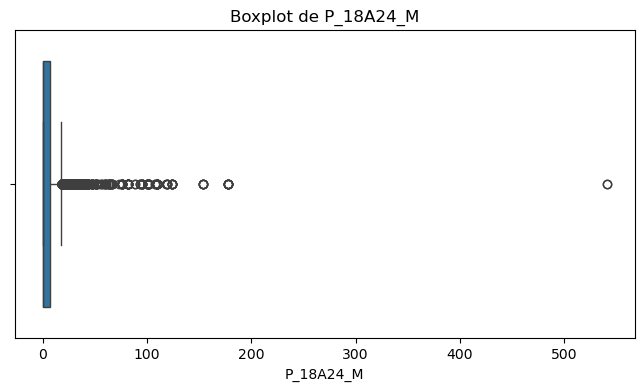

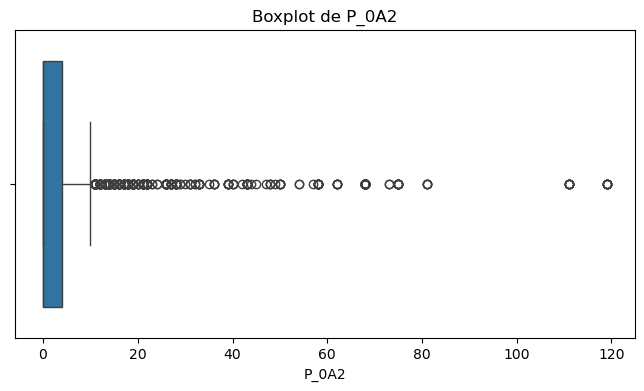

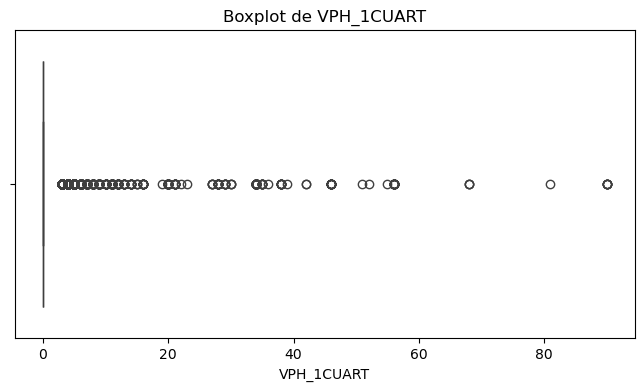

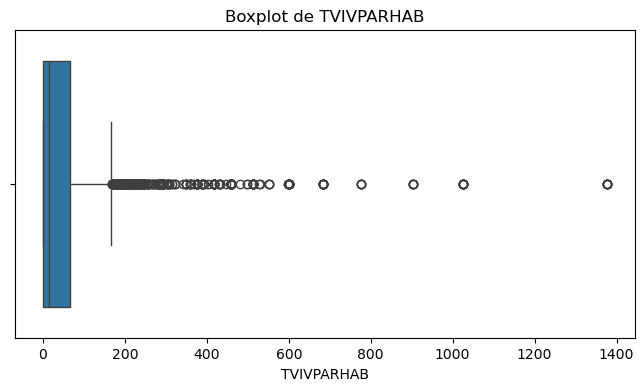

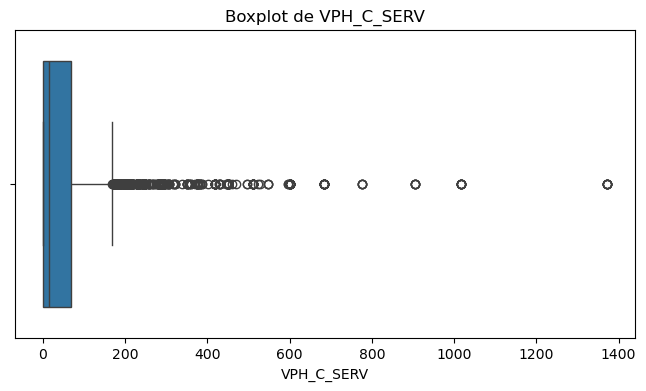

...

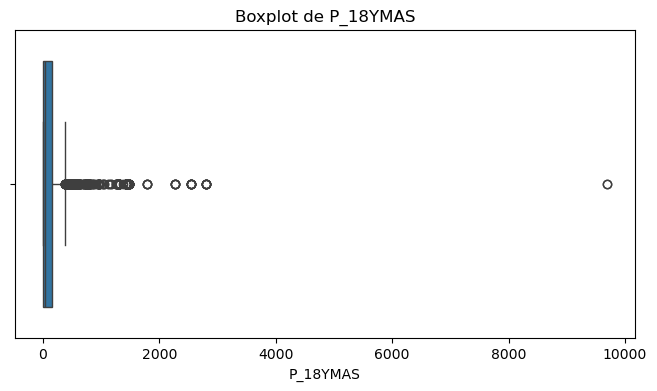

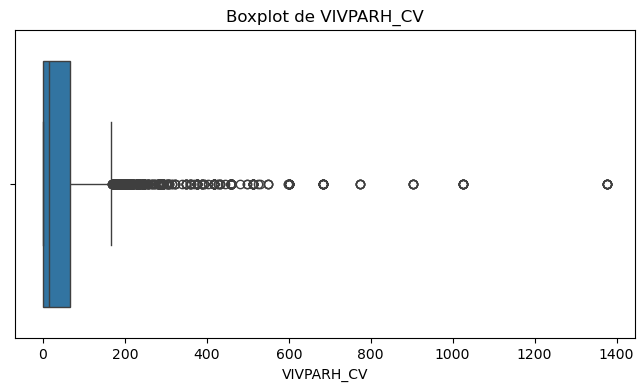

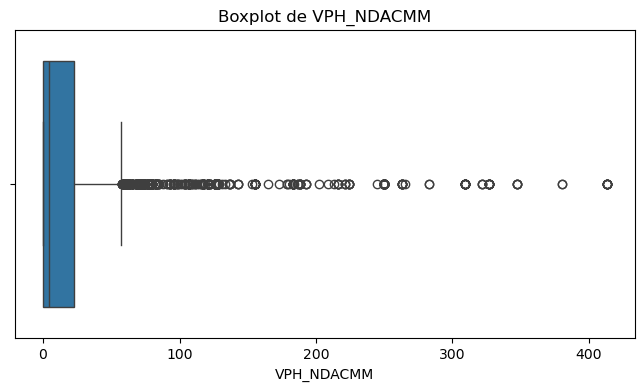

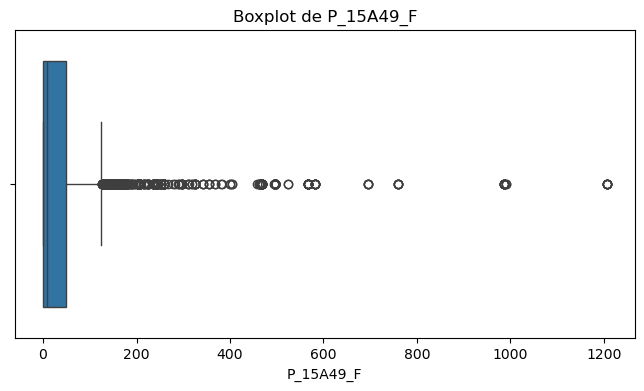

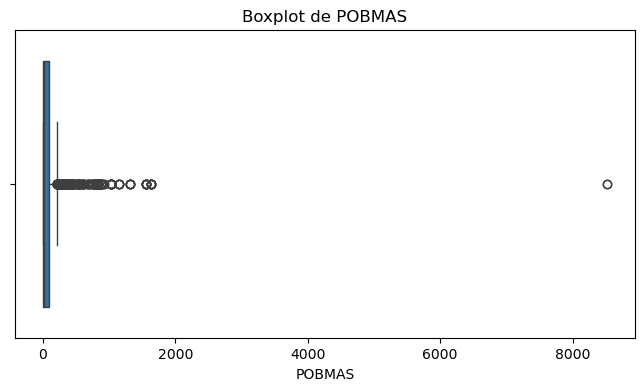

In [46]:
# Aplicar la función a las columnas numéricas
for col in numeric_cols:
    outliers = detectar_outliers_iqr(df, col)
    print(f"\nNúmero de outliers en {col}: {len(outliers)}")
    if len(outliers) > 0:
        print(outliers[[col]].head())
    # Visualizar outliers
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot de {col}")  

identificamos 2 outliers evidentes y muy seprados del resto de los datos en lote_m2, los cuales eliminamos

In [47]:
df.sort_values('lote_m2', ascending=False).head(5)

,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,road,quarter,borough,postcode,longitud_1,latitud_1,neighbourhood,distancia,source_file,colonia_top10
3212,26000.0,860000,2.0,2.0,2.0,1,0,revillagigedo 18 centro cuauhtemoc,cuauhtemoc,6500,...,Avenida Insurgentes Centro,None,Cuauhtémoc,06500,-99.159289,19.432015,cuauhtemoc,0.013051,merged_inmuebles24_departamentos_duckdb_2025-1...,cuauhtemoc
20259,19000.0,420000,1.0,1.0,1.0,0,0,alvaro obregon guadalupe inn guadalupe inn a...,guadalupe inn,1020,...,Avenida Revolución,None,Álvaro Obregón,01040,-99.190509,19.351696,guadalupe inn,0.000689,merged_inmuebles24_departamentos_duckdb_2025-1...,otros
1510,20000.0,13000,2.0,2.0,1.0,0,0,av. victor hugo portales norte benito juarez,portales norte,3303,...,Avenida Víctor Hugo,None,Benito Juárez,03303,-99.148644,19.370439,portales norte,0.000350,merged_inmuebles24_departamentos_duckdb_2025-1...,otros
3737,37000.0,10000,2.0,2.0,2.0,0,0,lago andromaco ampliacion granada miguel hidalgo,hidalgo,1120,...,Calle Tula,None,Álvaro Obregón,01120,-99.206255,19.400896,hidalgo,0.042794,merged_inmuebles24_departamentos_duckdb_2025-1...,hidalgo
3713,30000.0,9974,1.0,1.0,0.0,0,0,rio churubusco 601 xoco benito juarez,xoco,3330,...,Avenida Universidad,None,Benito Juárez,03330,-99.170877,19.360889,xoco,0.002160,merged_inmuebles24_departamentos_duckdb_2025-1...,xoco


In [48]:
# Identificar los índices de los dos outliers más grandes
outliers = df.sort_values('lote_m2', ascending=False).head(2).index

In [49]:
# Eliminar los outliers del DataFrame
df = df.drop(outliers)


In [50]:
categorical_columns = list(df.select_dtypes(include=["object", "category"]).columns)
categorical_columns.remove('direccion')

In [51]:
df = pd.get_dummies(df, columns=['municipio','colonia_top10'], drop_first=True)

In [52]:
df.head()

,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,colonia_top10_cuajimalpa,colonia_top10_cuauhtemoc,colonia_top10_del valle centro,colonia_top10_hidalgo,colonia_top10_hipodromo,colonia_top10_napoles,colonia_top10_narvarte poniente,colonia_top10_otros,colonia_top10_santa fe,colonia_top10_xoco
0,18000.0,130,2.0,1.0,1.0,0,0,rio becerra 135 8 de agosto benito juarez,8 de agosto,1180,...,False,False,False,False,False,False,False,True,False,False
1,30000.0,198,2.0,2.0,2.0,0,0,avenida rio mixcoac 206 acacias benito juarez,acacias,3240,...,False,False,False,False,False,False,False,True,False,False
2,23500.0,110,2.0,2.0,1.0,1,0,av. san francisco col. del valle actipan ben...,actipan,3230,...,False,False,False,False,False,False,False,True,False,False
3,14000.0,59,2.0,1.0,1.0,0,0,calle 2 agricola pantitlan iztacalco,agricola pantitlan,8100,...,False,False,False,False,False,False,False,True,False,False
4,14000.0,30,1.0,1.0,1.0,1,0,av. tamaulipas 257 alvaro obregon ciudad de m...,alvaro obregon,9230,...,False,False,False,False,False,False,False,True,False,False


In [53]:
df.shape

(8289, 178)

# Clustering
Realiza un análisis de clustering para agrupar los datos en diferentes segmentos.

In [54]:
df_analysis = df[numeric_cols].copy()

In [55]:
#df_analysis['random'] = np.random.rand(len(df_analysis))

In [56]:
cols = df_analysis.columns

In [57]:
# Escalar los datos
scaler = StandardScaler()
df_analysis[cols] = scaler.fit_transform(df_analysis[cols])

In [58]:
## Arreglar los nulos y quitar esta celda
df_analysis = df_analysis.dropna()

In [59]:
df_analysis.dtypes[120:]

Series([], dtype: object)

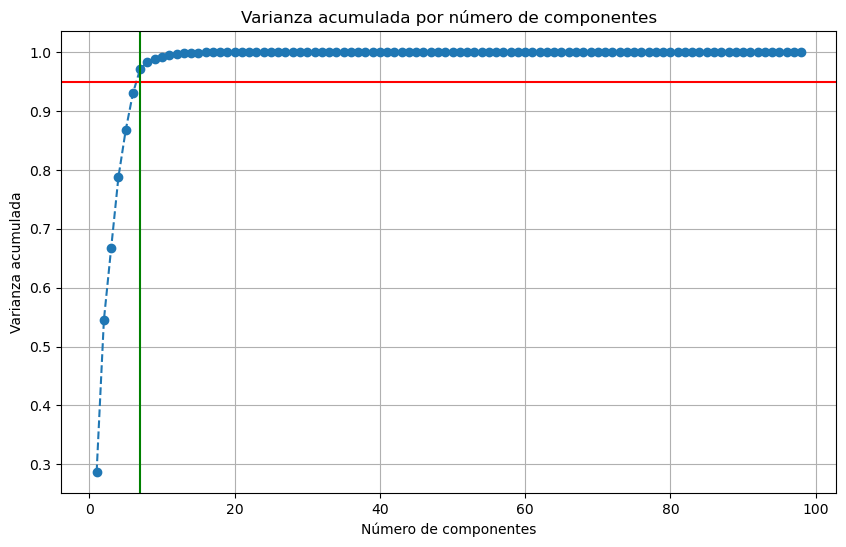

Número óptimo de componentes: 7


In [60]:
# Crear el modelo PCA sin especificar n_components
pca = PCA()
pca.fit(df_analysis)

# Calcular la varianza acumulada
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

#Gráfica de la varianza acumulada
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Varianza acumulada por número de componentes')
plt.xlabel('Número de componentes')
plt.ylabel('Varianza acumulada')
plt.axhline(y=0.95, color='r', linestyle='-')
plt.axvline(x=np.argmax(cumulative_variance >= 0.95) + 1, color='g', linestyle='-')
plt.grid()
plt.show()

# Elegir el número de componentes que expliquen al menos el 95% de la varianza
n_components = np.argmax(cumulative_variance >= 0.95) + 1
print(f"Número óptimo de componentes: {n_components}")



In [61]:
print("Varianza acumulada:")
print(cumulative_variance)


Varianza acumulada:
[0.28656272 0.54525845 0.667203   0.78775062 0.86738701 0.93044863
 0.97163206 0.98315176 0.98831271 0.99214858 0.99545964 0.99711634
 0.9985119  0.99893679 0.99929621 0.9996412  0.99990747 0.99999424
 0.99999869 0.99999943 0.99999974 0.99999993 0.99999997 1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         

In [62]:
# Aplicar PCA con el número óptimo de componentes
pca = PCA(n_components=n_components)
pca_data = pca.fit_transform(df_analysis)

In [63]:
# Importancia de cada componente (varianza explicada)
explained_variance = pca.explained_variance_ratio_
print("Varianza explicada por cada componente:")
for i, var in enumerate(explained_variance):
    print(f"Componente {i+1}: {var:.2%}")

Varianza explicada por cada componente:
Componente 1: 28.66%
Componente 2: 25.87%
Componente 3: 12.19%
Componente 4: 12.05%
Componente 5: 7.96%
Componente 6: 6.31%
Componente 7: 4.12%


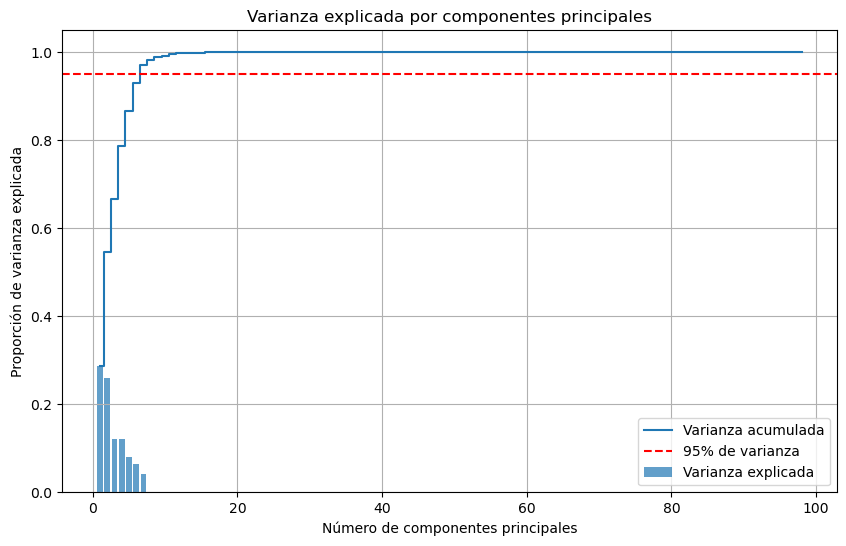

In [64]:
# Gráfica de varianza explicada por cada componente
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, label='Varianza explicada')
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', label='Varianza acumulada')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% de varianza')
plt.xlabel('Número de componentes principales')
plt.ylabel('Proporción de varianza explicada')
plt.title('Varianza explicada por componentes principales')
plt.legend(loc='best')
plt.grid()
plt.show()

In [65]:
# Contribución de las características originales a los primeros 22 componentes
components = pd.DataFrame(pca.components_[:20], columns=df_analysis.columns)
print("\nContribución de las características originales a los primeros 22 componentes:")
components.T.sort_values(by = 0, ascending=False)


Contribución de las características originales a los primeros 22 componentes:


,0,1,2,3,4,5,6
baños,0.499148,0.247061,-0.057617,-0.108940,0.038028,-0.029982,0.819825
recamaras,0.494029,0.283032,-0.084848,-0.249767,-0.669216,-0.042416,-0.395617
estacionamiento,0.443282,0.220962,-0.012841,-0.102481,0.711876,-0.285705,-0.394423
es_penthouse,0.227576,0.117402,0.660320,0.695830,-0.103673,-0.049454,-0.032065
lote_m2,0.183476,0.090947,0.020309,-0.005229,0.178772,0.955597,-0.111741
...,...,...,...,...,...,...,...
VIVPAR_HAB,-0.068554,0.131076,0.002916,-0.001857,0.003350,0.000296,0.002339
VPH_SINRTV,-0.069772,0.134364,0.004450,-0.003140,0.005699,0.000579,0.008553
VPH_NDACMM,-0.072621,0.139580,0.003083,-0.001983,0.003526,0.000606,0.004253
VPH_BICI,-0.083292,0.159185,0.004078,-0.001797,0.005911,0.001422,0.009581


In [66]:
most_important_features = components.iloc[0].abs().sort_values(ascending=False).head(35)
print("Características más importantes del primer componente:")
print(most_important_features)

Características más importantes del primer componente:
baños              0.499148
recamaras          0.494029
estacionamiento    0.443282
es_penthouse       0.227576
lote_m2            0.183476
es_amueblado       0.093118
VPH_BICI           0.083292
VPH_NDACMM         0.072621
VPH_SINRTV         0.069772
VIVPAR_HAB         0.068554
TVIVPAR            0.065816
VPH_TINACO         0.062889
HOGJEF_F           0.062362
VPH_1DOR           0.061630
PHOGJEF_F          0.058886
VPH_MOTO           0.058595
P_60YMAS_F         0.057808
VPH_REFRI          0.057011
TVIVHAB            0.056665
VPH_AEASP          0.056548
VPH_CISTER         0.056452
VPH_C_SERV         0.056435
VPH_DRENAJ         0.056418
VPH_DSADMA         0.056381
VPH_AGUADV         0.056234
VPH_CEL            0.056199
VPH_EXCSA          0.056196
VPH_C_ELEC         0.056175
TOTHOG             0.056167
TVIVPARHAB         0.056167
VIVPARH_CV         0.056165
VIVTOT             0.056013
VPH_TV             0.055760
VPH_3YMASC         0.

In [67]:
# Reconstrucción aproximada de los datos originales
reconstructed_data = pca.inverse_transform(pca_data)

In [68]:

# Comparar los datos originales con los reconstruidos
print("Datos originales (primeras filas):")
df_analysis.head()

Datos originales (primeras filas):


,P_18A24_M,P_0A2,VPH_1CUART,TVIVPARHAB,VPH_C_SERV,VPH_S_ELEC,VPH_SINRTV,P_12A14_F,VIVPAR_HAB,P_3A5_M,...,VPH_SINLTC,VPH_AGUADV,VPH_TV,VIVPAR_UT,P_15A17_F,P_18YMAS,VIVPARH_CV,VPH_NDACMM,P_15A49_F,POBMAS
0,-0.371383,-0.349249,-0.284139,-0.495217,-0.495687,0.0,-0.324233,-0.337791,-0.547697,-0.357182,...,-0.245861,-0.494861,-0.492685,-0.304052,-0.35384,-0.415174,-0.494781,-0.465895,-0.442115,-0.352287
6,-0.371383,-0.349249,-0.284139,-0.495217,-0.495687,0.0,-0.324233,-0.337791,-0.547697,-0.357182,...,-0.245861,-0.494861,-0.492685,-0.304052,-0.35384,-0.415174,-0.494781,-0.465895,-0.442115,-0.352287
13,-0.371383,-0.349249,-0.284139,-0.495217,-0.495687,0.0,-0.324233,-0.337791,-0.547697,-0.357182,...,-0.245861,-0.494861,-0.492685,-0.304052,-0.35384,-0.415174,-0.494781,-0.465895,-0.442115,-0.352287
16,-0.371383,-0.349249,-0.284139,-0.495217,-0.495687,0.0,-0.324233,-0.337791,-0.547697,-0.357182,...,-0.245861,-0.494861,-0.492685,-0.304052,-0.35384,-0.415174,-0.494781,-0.465895,-0.442115,-0.352287
22,-0.371383,-0.349249,-0.284139,-0.495217,-0.495687,0.0,-0.324233,-0.337791,-0.547697,-0.357182,...,-0.245861,-0.494861,-0.492685,-0.304052,-0.35384,-0.408121,-0.494781,-0.465895,-0.442115,-0.342156


In [69]:
print("\nDatos reconstruidos (primeras filas):")
pd.DataFrame(reconstructed_data, columns=df_analysis.columns).head()


Datos reconstruidos (primeras filas):


,P_18A24_M,P_0A2,VPH_1CUART,TVIVPARHAB,VPH_C_SERV,VPH_S_ELEC,VPH_SINRTV,P_12A14_F,VIVPAR_HAB,P_3A5_M,...,VPH_SINLTC,VPH_AGUADV,VPH_TV,VIVPAR_UT,P_15A17_F,P_18YMAS,VIVPARH_CV,VPH_NDACMM,P_15A49_F,POBMAS
0,-0.370039,-0.349055,-0.282755,-0.495465,-0.495934,2.384144e-16,-0.333104,-0.335949,-0.548660,-0.357214,...,-0.244366,-0.495104,-0.492712,-0.301111,-0.351727,-0.413866,-0.495031,-0.469093,-0.441442,-0.350611
1,-0.371860,-0.350611,-0.281651,-0.495546,-0.496021,4.451180e-17,-0.322379,-0.339342,-0.548667,-0.358401,...,-0.240501,-0.495184,-0.493050,-0.308777,-0.355227,-0.414371,-0.495103,-0.466536,-0.442852,-0.351345
2,-0.371214,-0.349984,-0.282255,-0.495461,-0.495935,-9.289855e-17,-0.325976,-0.337751,-0.548368,-0.357605,...,-0.242203,-0.495102,-0.492889,-0.305644,-0.353678,-0.414389,-0.495022,-0.466749,-0.442353,-0.351290
3,-0.370337,-0.349467,-0.282145,-0.495464,-0.495925,-1.845058e-16,-0.332624,-0.336264,-0.548788,-0.357188,...,-0.242562,-0.495103,-0.492730,-0.303143,-0.352364,-0.413664,-0.495028,-0.468544,-0.441657,-0.350352
4,-0.369782,-0.348731,-0.282613,-0.495123,-0.495591,2.325082e-16,-0.332685,-0.335673,-0.548232,-0.356935,...,-0.244102,-0.494762,-0.492372,-0.300893,-0.351477,-0.413573,-0.494689,-0.468663,-0.441130,-0.350352


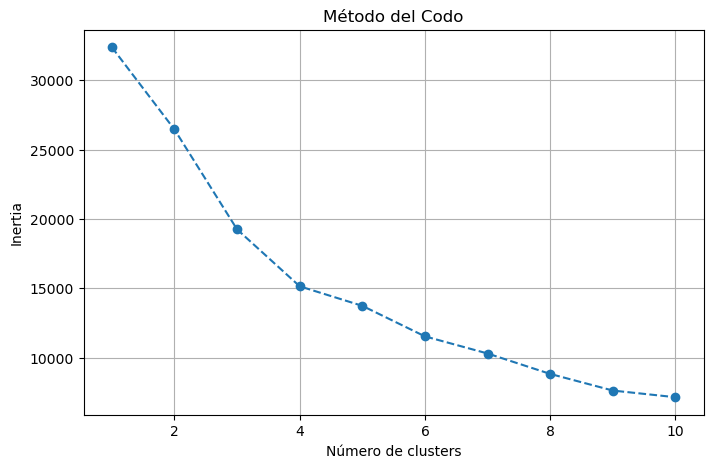

In [70]:
# Calcular la inertia para diferentes números de clusters
inertia = []
for k in range(1, 11):  # Probar de 1 a 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_data)  # Usa los datos reducidos por PCA
    inertia.append(kmeans.inertia_)

# Graficar el método del codo
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), inertia, marker='o', linestyle='--')
plt.xlabel('Número de clusters')
plt.ylabel('Inertia')
plt.title('Método del Codo')
plt.grid()
plt.show()

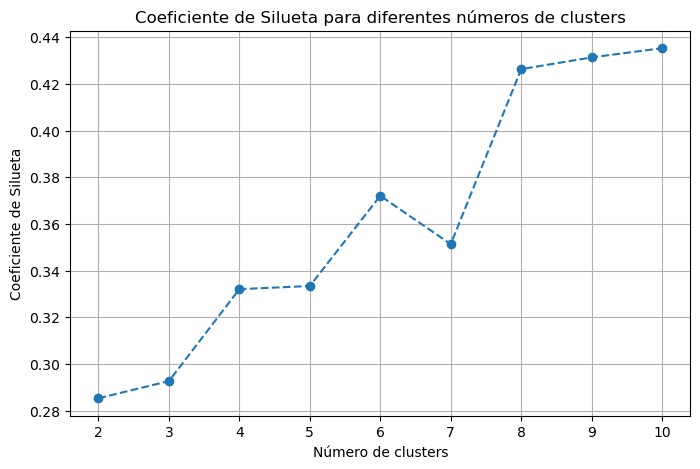

In [71]:
from sklearn.metrics import silhouette_score

# Calcular el coeficiente de silueta para diferentes números de clusters
silhouette_scores = []
for k in range(2, 11):  # Probar de 2 a 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_data)
    score = silhouette_score(pca_data, kmeans.labels_)
    silhouette_scores.append(score)

# Graficar el coeficiente de silueta
plt.figure(figsize=(8, 5))
plt.plot(range(2, 11), silhouette_scores, marker='o', linestyle='--')
plt.xlabel('Número de clusters')
plt.ylabel('Coeficiente de Silueta')
plt.title('Coeficiente de Silueta para diferentes números de clusters')
plt.grid()
plt.show()

In [84]:
# Aplicar el algoritmo K-Means para clustering
num_clusters = 4
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(df_analysis)

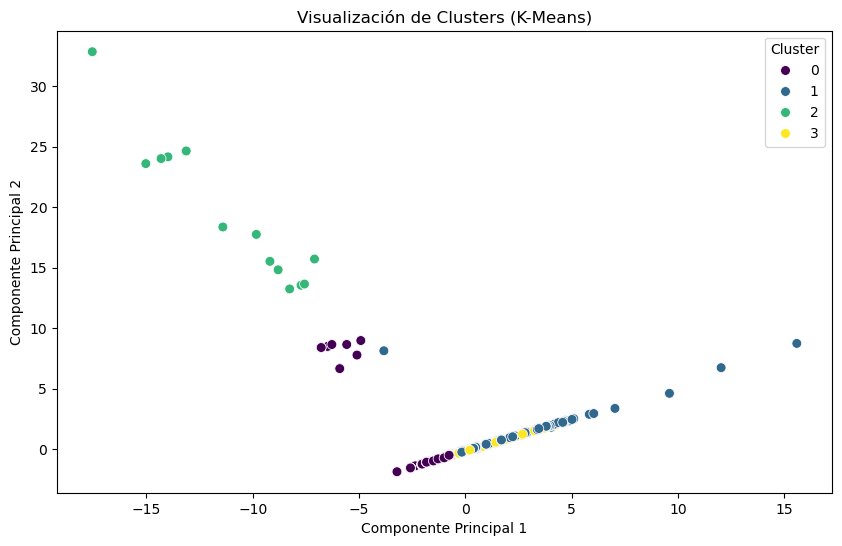

In [85]:

# Agregar los clusters al DataFrame original
df_analysis['Cluster'] = clusters

# Visualizar los clusters en el espacio reducido por PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_data[:, 0], y=pca_data[:, 1], hue=clusters, palette="viridis", s=50)
plt.title("Visualización de Clusters (K-Means)")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Cluster")
plt.show()

In [86]:
import plotly.express as px

# Crear un DataFrame con los datos de PCA y clusters
df_pca = pd.DataFrame(pca_data[:,:3], columns=['PC1', 'PC2', 'PC3'])  # Asegúrate de que pca_data tenga al menos 3 componentes
df_pca['Cluster'] = clusters  # Agregar los clusters al DataFrame

# Graficar en 3D con plotly
fig = px.scatter_3d(
    df_pca,
    x='PC1', y='PC2', z='PC3',  # Ejes del gráfico
    color='Cluster',            # Colorear por cluster
    title="Visualización de Clusters en 3D (K-Means)",
    opacity=0.3,                # Transparencia de los puntos
    size_max=1,                 # Tamaño máximo de los puntos
    symbol_sequence=['circle'], # Usar círculos como símbolo
    color_continuous_scale='Viridis'  # Paleta de colores
)

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=600,  # Ancho del gráfico
    height=600   # Alto del gráfico
)

# Mostrar el gráfico interactivo
fig.show()

In [87]:
# Mostrar el tamaño de cada cluster
cluster_sizes = df_analysis['Cluster'].value_counts()
print("\nTamaño de cada cluster:")
cluster_sizes


Tamaño de cada cluster:


Cluster
1    1571
0    1430
3     748
2      14
Name: count, dtype: int64

In [88]:
# Calcular las características promedio de cada cluster
numeric_columns = df_analysis.select_dtypes('number')
cluster_means = numeric_columns.groupby(df_analysis['Cluster']).mean()
cluster_means.T

Cluster,0,1,2,3
P_18A24_M,-0.364889,-0.370971,1.572255,-0.371239
P_0A2,-0.343430,-0.348328,1.976710,-0.349249
VPH_1CUART,-0.279100,-0.283059,0.513095,-0.284139
TVIVPARHAB,-0.487699,-0.494719,2.288831,-0.495217
VPH_C_SERV,-0.488127,-0.495205,2.302250,-0.495687
VPH_S_ELEC,0.000000,0.000000,0.000000,0.000000
VPH_SINRTV,-0.320203,-0.323010,3.381081,-0.324233
P_12A14_F,-0.331752,-0.337325,1.470805,-0.337791
VIVPAR_HAB,-0.539509,-0.547062,2.884877,-0.547697
P_3A5_M,-0.351787,-0.356441,1.545567,-0.357182


In [89]:
df_analysis.columns

Index(['P_18A24_M', 'P_0A2', 'VPH_1CUART', 'TVIVPARHAB', 'VPH_C_SERV',
       'VPH_S_ELEC', 'VPH_SINRTV', 'P_12A14_F', 'VIVPAR_HAB', 'P_3A5_M',
       'VPH_BICI', 'VPH_AGUAFV', 'VPH_NDEAED', 'TOTHOG', 'VPH_3YMASC',
       'VPH_EXCSA', 'es_penthouse', 'P_6A11', 'VPH_2YMASD', 'VPH_2CUART',
       'baños', 'VPH_DSADMA', 'P_6A11_M', 'recamaras', 'VPH_RADIO', 'P_60YMAS',
       'VPH_MOTO', 'VPH_REFRI', 'lote_m2', 'P_12A14', 'VPH_PC', 'OCUPVIVPAR',
       'TVIVPAR', 'P_18YMAS_F', 'P18YM_PB_M', 'POB65_MAS', 'P_60YMAS_M',
       'P18YM_PB_F', 'P_60YMAS_F', 'es_amueblado', 'P_18YMAS_M', 'HOGJEF_F',
       'PROM_OCUP', 'P_18A24', 'VPH_TELEF', 'PRO_OCUP_C', 'VPH_AUTOM',
       'PHOGJEF_F', 'POBFEM', 'HOGJEF_M', 'VPH_LETR', 'VPH_SINTIC',
       'VPH_AEASP', 'TVIVHAB', 'P_0A2_M', 'VPH_SINCINT', 'VPH_SNBIEN',
       'VPH_CISTER', 'P_6A11_F', 'VPH_SPMVPI', 'VPH_CVJ', 'P_3A5', 'P_8A14_F',
       'P_8A14', 'P_0A2_F', 'VPH_C_ELEC', 'P_15A17_M', 'VPH_TINACO', 'P_15A17',
       'estacionamiento', 'VPH_LAV

In [90]:
loadings = pd.DataFrame(
            pca.components_.T,
            columns=[f'PC{i+1}' for i in range(pca.n_components_)],
            index=df_analysis.drop('Cluster',axis =1).columns
        )

In [91]:
feature_importance_pca = np.sum(
            loadings.abs() * pca.explained_variance_ratio_, axis=1
        )
feature_importance_pca = feature_importance_pca.sort_values(ascending=False)

In [92]:
pd.set_option('display.max_rows', None)  # Mostrar todas las filas
feature_importance_pca.sort_values(ascending=False, inplace = True)

In [93]:
feature_importance_pca

recamaras          3.275067e-01
estacionamiento    2.890615e-01
es_penthouse       2.726844e-01
baños              2.657916e-01
es_amueblado       2.195034e-01
lote_m2            1.583120e-01
VPH_BICI           6.671797e-02
VPH_NDACMM         5.802832e-02
VPH_SINRTV         5.651745e-02
VIVPAR_HAB         5.451493e-02
TVIVPAR            5.229675e-02
VPH_TINACO         4.973007e-02
HOGJEF_F           4.951061e-02
VPH_1DOR           4.937446e-02
PHOGJEF_F          4.662081e-02
VPH_MOTO           4.598872e-02
P_60YMAS_F         4.563588e-02
VPH_REFRI          4.519612e-02
TVIVHAB            4.492432e-02
VPH_CISTER         4.483620e-02
VPH_AEASP          4.483297e-02
VPH_C_SERV         4.474036e-02
VPH_DRENAJ         4.472681e-02
VPH_DSADMA         4.469589e-02
VPH_AGUADV         4.458119e-02
VPH_CEL            4.456610e-02
VPH_EXCSA          4.454977e-02
VPH_C_ELEC         4.453480e-02
TOTHOG             4.452950e-02
TVIVPARHAB         4.452950e-02
VIVPARH_CV         4.452832e-02
VIVTOT  

In [94]:
feature_importance_pca.index

Index(['recamaras', 'estacionamiento', 'es_penthouse', 'baños', 'es_amueblado',
       'lote_m2', 'VPH_BICI', 'VPH_NDACMM', 'VPH_SINRTV', 'VIVPAR_HAB',
       'TVIVPAR', 'VPH_TINACO', 'HOGJEF_F', 'VPH_1DOR', 'PHOGJEF_F',
       'VPH_MOTO', 'P_60YMAS_F', 'VPH_REFRI', 'TVIVHAB', 'VPH_CISTER',
       'VPH_AEASP', 'VPH_C_SERV', 'VPH_DRENAJ', 'VPH_DSADMA', 'VPH_AGUADV',
       'VPH_CEL', 'VPH_EXCSA', 'VPH_C_ELEC', 'TOTHOG', 'TVIVPARHAB',
       'VIVPARH_CV', 'VIVTOT', 'VPH_TV', 'VPH_3YMASC', 'VPH_RADIO',
       'VPH_INTER', 'P18YM_PB', 'VPH_SINCINT', 'POB65_MAS', 'P18YM_PB_F',
       'VPH_LAVAD', 'P18YM_PB_M', 'P_60YMAS', 'P_18YMAS_F', 'VPH_TELEF',
       'POBHOG', 'OCUPVIVPAR', 'VPH_2CUART', 'HOGJEF_M', 'POBFEM',
       'VPH_2YMASD', 'VPH_HMICRO', 'VPH_PC', 'P_0A2_M', 'VPH_SPMVPI',
       'P_15A49_F', 'P_0A2', 'POBTOT', 'PHOGJEF_M', 'VPH_CVJ', 'PRO_OCUP_C',
       'P_3A5_F', 'P_18YMAS', 'P_18A24', 'P_18A24_F', 'P_3A5', 'VPH_STVP',
       'P_60YMAS_M', 'P_8A14_M', 'P_0A2_F', 'PROM_OCUP', 'P

In [95]:
#random_position = feature_importance_pca.index.get_loc('random')
# Quedarse solo con las features antes de 'random'
#filtered_features = feature_importance_pca.iloc[:random_position]
        

In [96]:
#filtered_features.index

NameError: name 'filtered_features' is not defined

In [97]:
#final_features = list(filtered_features.index)
final_features = list(feature_importance_pca.index)

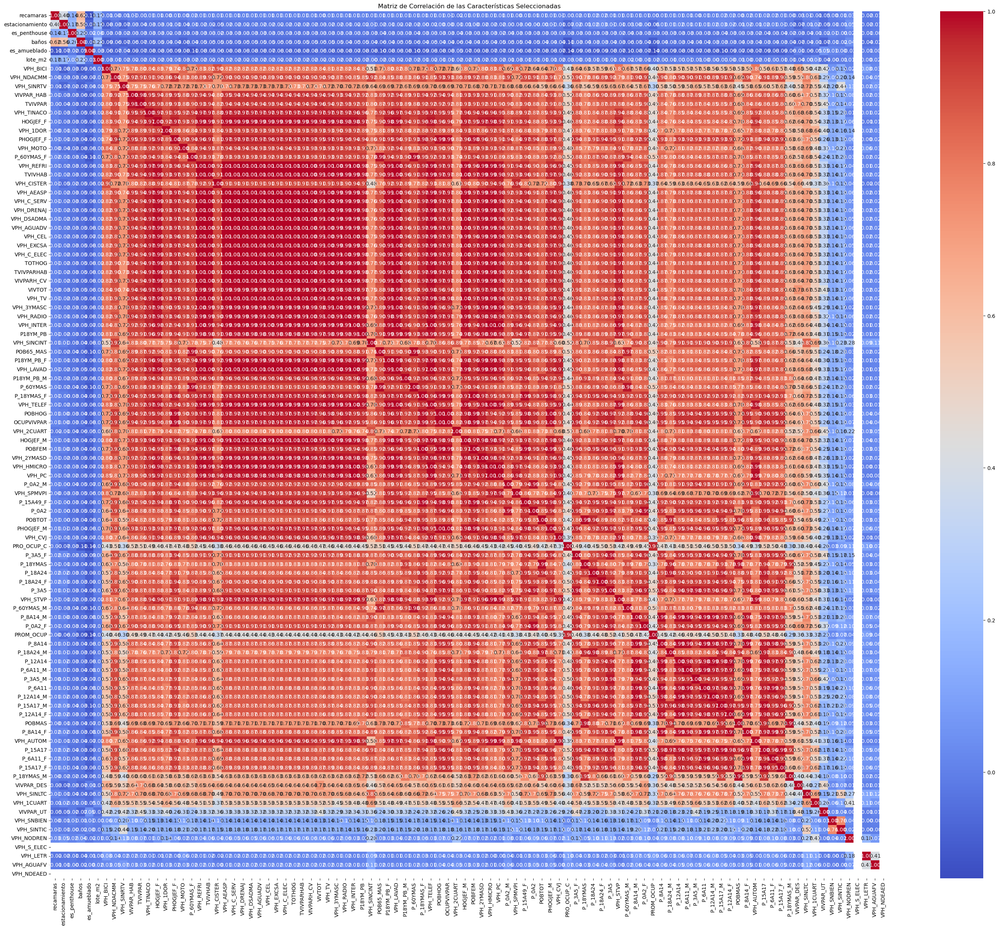

In [98]:
# Calcular la matriz de correlación para las características seleccionadas
correlation_matrix = df[final_features].corr()

# Visualizar la matriz de correlación
plt.figure(figsize=(36, 30))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Matriz de Correlación de las Características Seleccionadas")
plt.show()

In [99]:
# Establecer un umbral para considerar alta correlación
correlation_threshold = 0.60

# Identificar pares de características altamente correlacionadas
high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > correlation_threshold:
            high_corr_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))

print(f"Pares de características altamente correlacionadas (umbral > {correlation_threshold}):")
high_corr_pairs

Pares de características altamente correlacionadas (umbral > 0.6):


[('baños', 'recamaras'),
 ('VPH_NDACMM', 'VPH_BICI'),
 ('VPH_SINRTV', 'VPH_BICI'),
 ('VPH_SINRTV', 'VPH_NDACMM'),
 ('VIVPAR_HAB', 'VPH_BICI'),
 ('VIVPAR_HAB', 'VPH_NDACMM'),
 ('VIVPAR_HAB', 'VPH_SINRTV'),
 ('TVIVPAR', 'VPH_BICI'),
 ('TVIVPAR', 'VPH_NDACMM'),
 ('TVIVPAR', 'VPH_SINRTV'),
 ('TVIVPAR', 'VIVPAR_HAB'),
 ('VPH_TINACO', 'VPH_BICI'),
 ('VPH_TINACO', 'VPH_NDACMM'),
 ('VPH_TINACO', 'VPH_SINRTV'),
 ('VPH_TINACO', 'VIVPAR_HAB'),
 ('VPH_TINACO', 'TVIVPAR'),
 ('HOGJEF_F', 'VPH_BICI'),
 ('HOGJEF_F', 'VPH_NDACMM'),
 ('HOGJEF_F', 'VPH_SINRTV'),
 ('HOGJEF_F', 'VIVPAR_HAB'),
 ('HOGJEF_F', 'TVIVPAR'),
 ('HOGJEF_F', 'VPH_TINACO'),
 ('VPH_1DOR', 'VPH_BICI'),
 ('VPH_1DOR', 'VPH_NDACMM'),
 ('VPH_1DOR', 'VPH_SINRTV'),
 ('VPH_1DOR', 'VIVPAR_HAB'),
 ('VPH_1DOR', 'TVIVPAR'),
 ('VPH_1DOR', 'VPH_TINACO'),
 ('VPH_1DOR', 'HOGJEF_F'),
 ('PHOGJEF_F', 'VPH_BICI'),
 ('PHOGJEF_F', 'VPH_NDACMM'),
 ('PHOGJEF_F', 'VPH_SINRTV'),
 ('PHOGJEF_F', 'VIVPAR_HAB'),
 ('PHOGJEF_F', 'TVIVPAR'),
 ('PHOGJEF_F', 'VPH_TINAC

In [100]:
# Crear un conjunto para almacenar las características a eliminar
features_to_remove = set()

# Para cada par de características correlacionadas, eliminar la menos importante según PCA
for feature1, feature2 in high_corr_pairs:
    if feature_importance_pca[feature1] < feature_importance_pca[feature2]:
        features_to_remove.add(feature1)
    else:
        features_to_remove.add(feature2)

# Filtrar las características finales eliminando las correlacionadas menos importantes
final_features_filtered = [feature for feature in final_features if feature not in features_to_remove]

print(f"Características finales después de eliminar correlacionadas: {len(final_features_filtered)}")
final_features_filtered

Características finales después de eliminar correlacionadas: 14


['recamaras',
 'estacionamiento',
 'es_penthouse',
 'es_amueblado',
 'lote_m2',
 'VPH_BICI',
 'PRO_OCUP_C',
 'VIVPAR_UT',
 'VPH_SNBIEN',
 'VPH_NODREN',
 'VPH_S_ELEC',
 'VPH_LETR',
 'VPH_AGUAFV',
 'VPH_NDEAED']

In [101]:
final_features = final_features_filtered.copy()

# Entrenamiento de Modelos

## Regresión Lineal

Usando todas las 14 features
Forma del dataset: X (8289, 14), y (8289,)
Features seleccionadas: ['recamaras', 'estacionamiento', 'es_penthouse', 'es_amueblado', 'lote_m2', 'VPH_BICI', 'PRO_OCUP_C', 'VIVPAR_UT', 'VPH_SNBIEN', 'VPH_NODREN', 'VPH_S_ELEC', 'VPH_LETR', 'VPH_AGUAFV', 'VPH_NDEAED']

Valores faltantes en X: 3610
Valores faltantes en y: 0
Después de eliminar NaN: X (6523, 14), y (6523,)

División de datos:
Entrenamiento: X (5218, 14), y (5218,)
Prueba: X (1305, 14), y (1305,)

Entrenando el modelo...
Entrenamiento completado en 0.01 segundos.

Resultados Entrenamiento:
Error cuadrático medio (MSE): 521,333,337.08
Raíz del error cuadrático medio (RMSE): 22,832.73
Error absoluto medio (MAE): 14,660.00
Coeficiente de determinación (R²): 0.4542

Resultados Prueba:
Error cuadrático medio (MSE): 460,193,965.41
Raíz del error cuadrático medio (RMSE): 21,452.13
Error absoluto medio (MAE): 14,604.50
Coeficiente de determinación (R²): 0.5172

Validación cruzada (5-fold):
R² promedio: 0.4

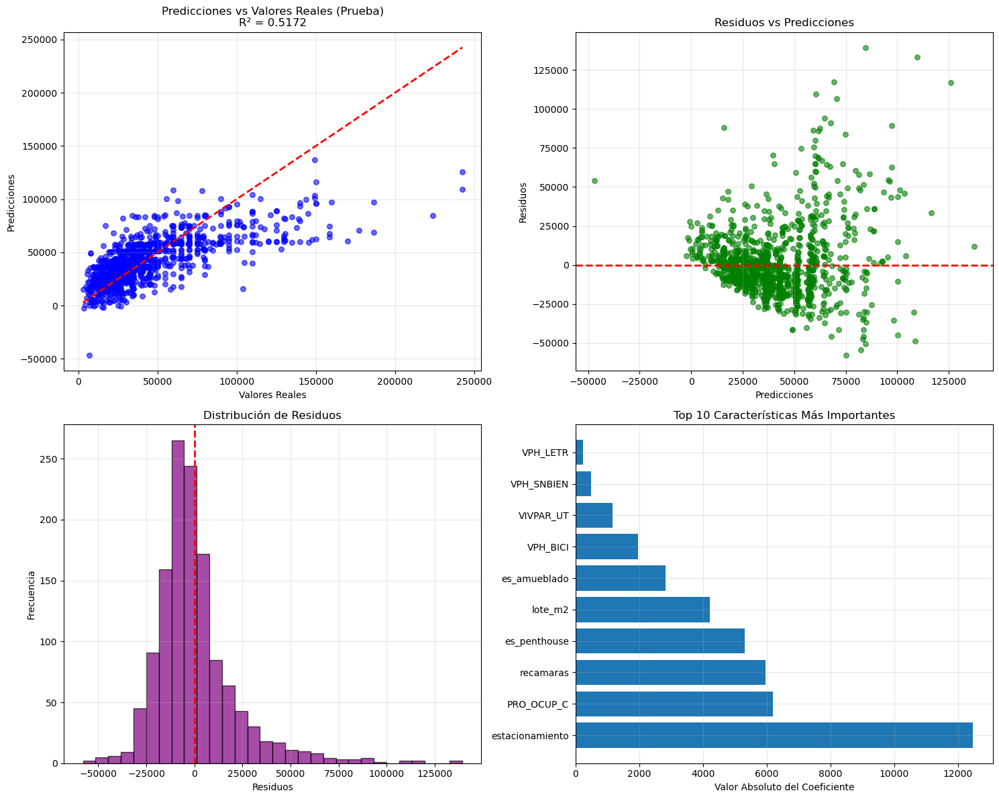


Comparación Entrenamiento vs Prueba:
Métrica  Entrenamiento       Prueba
    MSE   5.213333e+08 4.601940e+08
   RMSE   2.283273e+04 2.145213e+04
    MAE   1.466000e+04 1.460450e+04
     R²   4.541668e-01 5.172112e-01

✅ Modelo con buen rendimiento y generalización

Modelo entrenado exitosamente con 14 características


In [102]:
# Regresión Lineal con Pipeline Completo
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import time

# Seleccionar las características (X) y la variable objetivo (y)
target_column = 'precio_mxn'

# Filtrar features antes de 'random' si existe
if 'random' in final_features:
    final_features_filtered = final_features[:final_features.index('random')]
    print(f"Filtradas {len(final_features_filtered)} features antes de 'random'")
else:
    final_features_filtered = final_features
    print(f"Usando todas las {len(final_features_filtered)} features")

X = df[final_features_filtered]
y = df[target_column]

print(f"Forma del dataset: X {X.shape}, y {y.shape}")
print(f"Features seleccionadas: {final_features_filtered}")

# Verificar valores faltantes
print(f"\nValores faltantes en X: {X.isnull().sum().sum()}")
print(f"Valores faltantes en y: {y.isnull().sum()}")

# Eliminar filas con valores faltantes si los hay
if X.isnull().sum().sum() > 0 or y.isnull().sum() > 0:
    mask = ~(X.isnull().any(axis=1) | y.isnull())
    X = X[mask]
    y = y[mask]
    print(f"Después de eliminar NaN: X {X.shape}, y {y.shape}")

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42, 
    stratify=None  # Para regresión no usamos stratify
)

print(f"\nDivisión de datos:")
print(f"Entrenamiento: X {X_train.shape}, y {y_train.shape}")
print(f"Prueba: X {X_test.shape}, y {y_test.shape}")

# Crear el pipeline con StandardScaler y LinearRegression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

# Entrenar el modelo
print("\nEntrenando el modelo...")
start_time = time.time()
pipeline.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time 
print(f"Entrenamiento completado en {training_time:.2f} segundos.")

# Realizar predicciones
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluar el modelo
def evaluate_model(y_true, y_pred, dataset_name=""):
    """Función para evaluar el modelo con múltiples métricas"""
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\nResultados {dataset_name}:")
    print(f"Error cuadrático medio (MSE): {mse:,.2f}")
    print(f"Raíz del error cuadrático medio (RMSE): {rmse:,.2f}")
    print(f"Error absoluto medio (MAE): {mae:,.2f}")
    print(f"Coeficiente de determinación (R²): {r2:.4f}")
    
    return {'mse': mse, 'rmse': rmse, 'mae': mae, 'r2': r2}

# Evaluar en entrenamiento y prueba
train_metrics = evaluate_model(y_train, y_pred_train, "Entrenamiento")
test_metrics = evaluate_model(y_test, y_pred_test, "Prueba")

# Validación cruzada
print(f"\nValidación cruzada (5-fold):")
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2')
print(f"R² promedio: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

cv_scores_rmse = cross_val_score(pipeline, X_train, y_train, cv=5, 
                                scoring='neg_mean_squared_error')
cv_rmse = np.sqrt(-cv_scores_rmse)
print(f"RMSE promedio: {cv_rmse.mean():,.2f} (+/- {cv_rmse.std() * 2:,.2f})")

# Análisis de coeficientes
scaler = pipeline.named_steps['scaler']
regressor = pipeline.named_steps['regressor']

# Obtener coeficientes e importancia
feature_importance = pd.DataFrame({
    'feature': final_features_filtered,
    'coefficient': regressor.coef_,
    'abs_coefficient': np.abs(regressor.coef_)
}).sort_values('abs_coefficient', ascending=False)

print(f"\nTop 10 características más importantes:")
print(feature_importance.head(10).to_string(index=False))

# Visualizaciones mejoradas
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Predicciones vs Valores Reales (Prueba)
axes[0,0].scatter(y_test, y_pred_test, alpha=0.6, color='blue', s=30)
axes[0,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
               color='red', linestyle='--', linewidth=2)
axes[0,0].set_title(f"Predicciones vs Valores Reales (Prueba)\nR² = {test_metrics['r2']:.4f}")
axes[0,0].set_xlabel("Valores Reales")
axes[0,0].set_ylabel("Predicciones")
axes[0,0].grid(True, alpha=0.3)

# 2. Residuos vs Predicciones
residuals_test = y_test - y_pred_test
axes[0,1].scatter(y_pred_test, residuals_test, alpha=0.6, color='green', s=30)
axes[0,1].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[0,1].set_title("Residuos vs Predicciones")
axes[0,1].set_xlabel("Predicciones")
axes[0,1].set_ylabel("Residuos")
axes[0,1].grid(True, alpha=0.3)

# 3. Distribución de residuos
axes[1,0].hist(residuals_test, bins=30, alpha=0.7, color='purple', edgecolor='black')
axes[1,0].axvline(x=0, color='red', linestyle='--', linewidth=2)
axes[1,0].set_title("Distribución de Residuos")
axes[1,0].set_xlabel("Residuos")
axes[1,0].set_ylabel("Frecuencia")
axes[1,0].grid(True, alpha=0.3)

# 4. Importancia de características (Top 10)
top_10_features = feature_importance.head(10)
axes[1,1].barh(range(len(top_10_features)), top_10_features['abs_coefficient'])
axes[1,1].set_yticks(range(len(top_10_features)))
axes[1,1].set_yticklabels(top_10_features['feature'])
axes[1,1].set_title("Top 10 Características Más Importantes")
axes[1,1].set_xlabel("Valor Absoluto del Coeficiente")
axes[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Comparación Entrenamiento vs Prueba
comparison_df = pd.DataFrame({
    'Métrica': ['MSE', 'RMSE', 'MAE', 'R²'],
    'Entrenamiento': [train_metrics['mse'], train_metrics['rmse'], 
                     train_metrics['mae'], train_metrics['r2']],
    'Prueba': [test_metrics['mse'], test_metrics['rmse'], 
              test_metrics['mae'], test_metrics['r2']]
})

print(f"\nComparación Entrenamiento vs Prueba:")
print(comparison_df.to_string(index=False))

# Detectar posible overfitting
if train_metrics['r2'] - test_metrics['r2'] > 0.1:
    print(f"\n⚠️  Posible overfitting detectado:")
    print(f"   Diferencia R²: {train_metrics['r2'] - test_metrics['r2']:.4f}")
elif test_metrics['r2'] < 0.5:
    print(f"\n⚠️  Modelo con bajo rendimiento:")
    print(f"   R² en prueba: {test_metrics['r2']:.4f}")
else:
    print(f"\n✅ Modelo con buen rendimiento y generalización")

# Guardar el modelo entrenado y métricas
model_results_linear = {
    'pipeline': pipeline,
    'train_metrics': train_metrics,
    'test_metrics': test_metrics,
    'feature_importance': feature_importance,
    'cv_scores': cv_scores,
    'training_time': training_time
}

print(f"\nModelo entrenado exitosamente con {len(final_features_filtered)} características")


### RandomForestRegressor

Forma del dataset: X (8289, 14), y (8289,)
Features seleccionadas: ['recamaras', 'estacionamiento', 'es_penthouse', 'es_amueblado', 'lote_m2', 'VPH_BICI', 'PRO_OCUP_C', 'VIVPAR_UT', 'VPH_SNBIEN', 'VPH_NODREN', 'VPH_S_ELEC', 'VPH_LETR', 'VPH_AGUAFV', 'VPH_NDEAED']
Después de eliminar NaN: X (6523, 14), y (6523,)

División de datos:
Entrenamiento: X (5218, 14), y (5218,)
Prueba: X (1305, 14), y (1305,)

Entrenando el modelo Random Forest...
Entrenamiento completado en 0.28 segundos.

Resultados Entrenamiento (Random Forest):
Error cuadrático medio (MSE): 117,040,107.15
Raíz del error cuadrático medio (RMSE): 10,818.51
Error absoluto medio (MAE): 6,980.54
Coeficiente de determinación (R²): 0.8775

Resultados Prueba (Random Forest):
Error cuadrático medio (MSE): 237,179,493.05
Raíz del error cuadrático medio (RMSE): 15,400.63
Error absoluto medio (MAE): 9,445.64
Coeficiente de determinación (R²): 0.7512

Validación cruzada (5-fold):
R² promedio: 0.6971 (+/- 0.0344)
RMSE promedio: 16,946.17

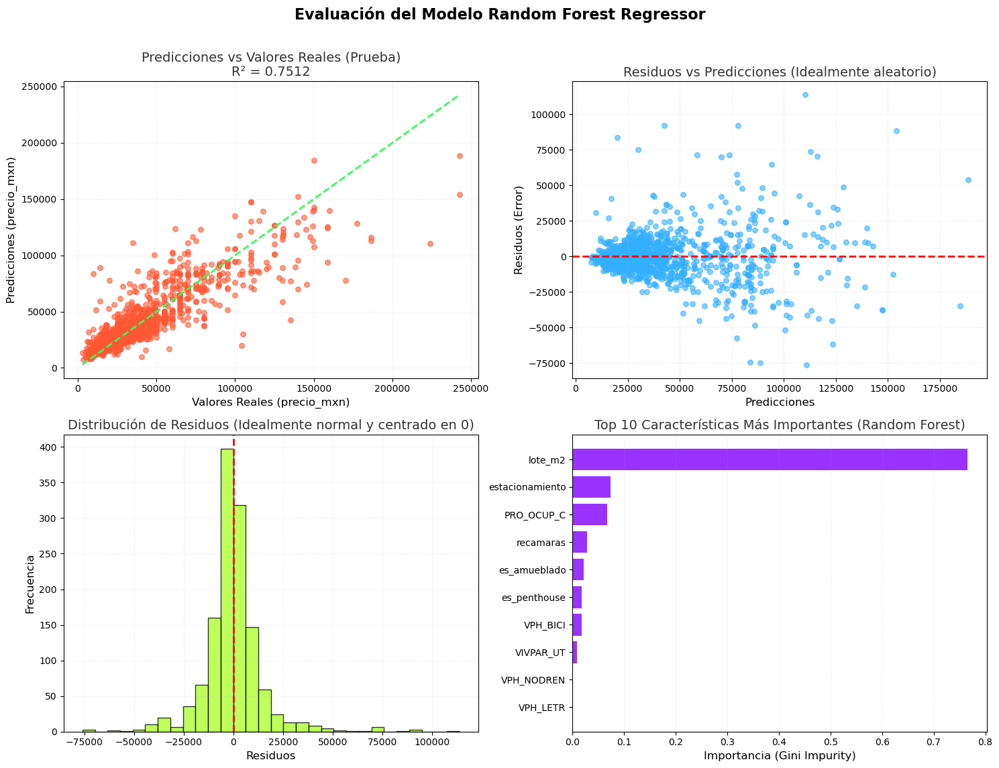


Comparación Entrenamiento vs Prueba:
Métrica  Entrenamiento       Prueba
    MSE   1.170401e+08 2.371795e+08
   RMSE   1.081851e+04 1.540063e+04
    MAE   6.980537e+03 9.445641e+03
     R²   8.774596e-01 7.511753e-01

✅ Modelo Random Forest con buen rendimiento y generalización.

Modelo Random Forest entrenado exitosamente con 14 características


In [103]:
# Regresión No Lineal con Pipeline (Random Forest Regressor)
from sklearn.model_selection import train_test_split, cross_val_score
# Importamos el nuevo modelo: Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- Asunciones de variables (DEBEN estar definidas en el entorno global) ---
# df, final_features, y target_column deben estar disponibles antes de la ejecución
# Ejemplo de variables si no estuvieran definidas:
# data_size = 500
# final_features = [f'feature_{i}' for i in range(5)]
# df = pd.DataFrame(np.random.rand(data_size, 5), columns=final_features)
# df['precio_mxn'] = df.iloc[:, 0] * 100 + df.iloc[:, 1] * 50 + np.random.randn(data_size) * 10
# target_column = 'precio_mxn'
# -------------------------------------------------------------------------

# Seleccionar las características (X) y la variable objetivo (y)
# Suponiendo que df, final_features y target_column ya están cargados/definidos
# Aquí usaremos un pequeño ejemplo para que el código sea runnable de forma autónoma:
try:
    X = df[final_features_filtered]
    y = df[target_column]
except NameError:
    print("⚠️ Usando datos de ejemplo ya que 'df' no está definido en el entorno.")
    data_size = 1000
    final_features = [f'area_m2', 'num_habitaciones', 'distancia_centro_km', 'antiguedad_anos', 'dummy_col']
    df = pd.DataFrame(np.random.rand(data_size, 5), columns=final_features)
    df['precio_mxn'] = (df['area_m2'] * 500000) + (df['num_habitaciones'] * 100000) + (np.random.randn(data_size) * 50000)
    target_column = 'precio_mxn'
    final_features_filtered = final_features
    X = df[final_features_filtered]
    y = df[target_column]


print(f"Forma del dataset: X {X.shape}, y {y.shape}")
print(f"Features seleccionadas: {final_features_filtered}")

# Verificar y limpiar valores faltantes (mismo código que el original)
if X.isnull().sum().sum() > 0 or y.isnull().sum() > 0:
    mask = ~(X.isnull().any(axis=1) | y.isnull())
    X = X[mask]
    y = y[mask]
    print(f"Después de eliminar NaN: X {X.shape}, y {y.shape}")

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42
)

print(f"\nDivisión de datos:")
print(f"Entrenamiento: X {X_train.shape}, y {y_train.shape}")
print(f"Prueba: X {X_test.shape}, y {y_test.shape}")

# --- CAMBIO CLAVE: Reemplazar LinearRegression por RandomForestRegressor ---
# Random Forest es un modelo de ensamble basado en árboles que captura no linealidades.
# El StandardScaler (escalamiento) es menos crítico aquí, pero se mantiene en el pipeline.
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', RandomForestRegressor(
        n_estimators=100,  # Número de árboles en el bosque
        max_depth=10,      # Profundidad máxima de los árboles para evitar sobreajuste
        random_state=42,
        n_jobs=-1          # Usa todos los núcleos de CPU disponibles
    ))
])

# Entrenar el modelo
print("\nEntrenando el modelo Random Forest...")
start_time = time.time()
pipeline.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
print(f"Entrenamiento completado en {training_time:.2f} segundos.")

# Realizar predicciones
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluar el modelo (función de evaluación reutilizada)
def evaluate_model(y_true, y_pred, dataset_name=""):
    """Función para evaluar el modelo con múltiples métricas"""
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\nResultados {dataset_name}:")
    print(f"Error cuadrático medio (MSE): {mse:,.2f}")
    print(f"Raíz del error cuadrático medio (RMSE): {rmse:,.2f}")
    print(f"Error absoluto medio (MAE): {mae:,.2f}")
    print(f"Coeficiente de determinación (R²): {r2:.4f}")
    
    return {'mse': mse, 'rmse': rmse, 'mae': mae, 'r2': r2}

# Evaluar en entrenamiento y prueba
train_metrics = evaluate_model(y_train, y_pred_train, "Entrenamiento (Random Forest)")
test_metrics = evaluate_model(y_test, y_pred_test, "Prueba (Random Forest)")

# Validación cruzada
print(f"\nValidación cruzada (5-fold):")
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2', n_jobs=-1)
print(f"R² promedio: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

cv_scores_rmse = cross_val_score(pipeline, X_train, y_train, cv=5, 
                                scoring='neg_mean_squared_error', n_jobs=-1)
cv_rmse = np.sqrt(-cv_scores_rmse)
print(f"RMSE promedio: {cv_rmse.mean():,.2f} (+/- {cv_rmse.std() * 2:,.2f})")

# Análisis de Importancia de Características (diferente al de Regresión Lineal)
regressor = pipeline.named_steps['regressor']

# Obtener la importancia de las características del Random Forest
feature_importance = pd.DataFrame({
    'feature': final_features_filtered,
    'importance': regressor.feature_importances_
}).sort_values('importance', ascending=False)

print(f"\nTop 10 características más importantes (Random Forest):")
# Usamos 'importance' en lugar de 'abs_coefficient'
print(feature_importance.head(10).to_string(index=False))

# Visualizaciones mejoradas (reutilizando la estructura de la gráfica)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Predicciones vs Valores Reales (Prueba)
axes[0,0].scatter(y_test, y_pred_test, alpha=0.6, color='#FF5733', s=30)
axes[0,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
               color='#33FF57', linestyle='--', linewidth=2)
axes[0,0].set_title(f"Predicciones vs Valores Reales (Prueba)\nR² = {test_metrics['r2']:.4f}", 
                    fontsize=14, color='#333333')
axes[0,0].set_xlabel("Valores Reales (precio_mxn)", fontsize=12)
axes[0,0].set_ylabel("Predicciones (precio_mxn)", fontsize=12)
axes[0,0].grid(True, alpha=0.3, linestyle=':')

# 2. Residuos vs Predicciones
residuals_test = y_test - y_pred_test
axes[0,1].scatter(y_pred_test, residuals_test, alpha=0.6, color='#33AFFF', s=30)
axes[0,1].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[0,1].set_title("Residuos vs Predicciones (Idealmente aleatorio)", 
                    fontsize=14, color='#333333')
axes[0,1].set_xlabel("Predicciones", fontsize=12)
axes[0,1].set_ylabel("Residuos (Error)", fontsize=12)
axes[0,1].grid(True, alpha=0.3, linestyle=':')

# 3. Distribución de residuos
axes[1,0].hist(residuals_test, bins=30, alpha=0.8, color='#AFFF33', edgecolor='black')
axes[1,0].axvline(x=0, color='red', linestyle='--', linewidth=2)
axes[1,0].set_title("Distribución de Residuos (Idealmente normal y centrado en 0)", 
                    fontsize=14, color='#333333')
axes[1,0].set_xlabel("Residuos", fontsize=12)
axes[1,0].set_ylabel("Frecuencia", fontsize=12)
axes[1,0].grid(True, alpha=0.3, linestyle=':')

# 4. Importancia de características (Top 10)
top_10_features = feature_importance.head(10)
axes[1,1].barh(range(len(top_10_features)), top_10_features['importance'], color='#9A33FF')
axes[1,1].set_yticks(range(len(top_10_features)))
axes[1,1].set_yticklabels(top_10_features['feature'], fontsize=10)
axes[1,1].set_title("Top 10 Características Más Importantes (Random Forest)", 
                    fontsize=14, color='#333333')
axes[1,1].set_xlabel("Importancia (Gini Impurity)", fontsize=12)
axes[1,1].invert_yaxis() # Pone la más importante arriba
axes[1,1].grid(axis='x', alpha=0.3, linestyle=':')

plt.suptitle("Evaluación del Modelo Random Forest Regressor", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# Comparación Entrenamiento vs Prueba
comparison_df = pd.DataFrame({
    'Métrica': ['MSE', 'RMSE', 'MAE', 'R²'],
    'Entrenamiento': [train_metrics['mse'], train_metrics['rmse'], 
                     train_metrics['mae'], train_metrics['r2']],
    'Prueba': [test_metrics['mse'], test_metrics['rmse'], 
              test_metrics['mae'], test_metrics['r2']]
})

print(f"\nComparación Entrenamiento vs Prueba:")
print(comparison_df.to_string(index=False))

# Detectar posible overfitting
# En Random Forest, la diferencia R² tiende a ser mayor, pero el R² de prueba debe ser alto.
r2_diff = train_metrics['r2'] - test_metrics['r2']
if r2_diff > 0.15: # Un umbral más alto para modelos de árbol
    print(f"\n⚠️  Random Forest detectado con posible sobreajuste (Overfitting):")
    print(f"   Diferencia R² (Entrenamiento - Prueba): {r2_diff:.4f}")
    print("   Considera reducir max_depth o aumentar min_samples_split.")
elif test_metrics['r2'] < 0.6:
    print(f"\n⚠️  Modelo con bajo rendimiento:")
    print(f"   R² en prueba: {test_metrics['r2']:.4f}")
else:
    print(f"\n✅ Modelo Random Forest con buen rendimiento y generalización.")

# Guardar el modelo entrenado y métricas (actualizado)
model_results_rf = {
    'pipeline': pipeline,
    'train_metrics': train_metrics,
    'test_metrics': test_metrics,
    'feature_importance': feature_importance,
    'cv_scores': cv_scores,
    'training_time': training_time
}

print(f"\nModelo Random Forest entrenado exitosamente con {len(final_features_filtered)} características")


## GradientBoostingRegressor

Forma del dataset: X (8289, 14), y (8289,)
Features seleccionadas: ['recamaras', 'estacionamiento', 'es_penthouse', 'es_amueblado', 'lote_m2', 'VPH_BICI', 'PRO_OCUP_C', 'VIVPAR_UT', 'VPH_SNBIEN', 'VPH_NODREN', 'VPH_S_ELEC', 'VPH_LETR', 'VPH_AGUAFV', 'VPH_NDEAED']
Después de eliminar NaN: X (6523, 14), y (6523,)

División de datos:
Entrenamiento: X (5218, 14), y (5218,)
Prueba: X (1305, 14), y (1305,)

Entrenando el modelo Gradient Boosting Regressor (GBM)...
Entrenamiento completado en 0.26 segundos.

Resultados Entrenamiento (GBM):
Error cuadrático medio (MSE): 200,404,464.32
Raíz del error cuadrático medio (RMSE): 14,156.43
Error absoluto medio (MAE): 9,127.37
Coeficiente de determinación (R²): 0.7902

Resultados Prueba (GBM):
Error cuadrático medio (MSE): 242,443,470.20
Raíz del error cuadrático medio (RMSE): 15,570.60
Error absoluto medio (MAE): 10,011.56
Coeficiente de determinación (R²): 0.7457

Validación cruzada (5-fold):
R² promedio: 0.7029 (+/- 0.0472)
RMSE promedio: 16,759.6

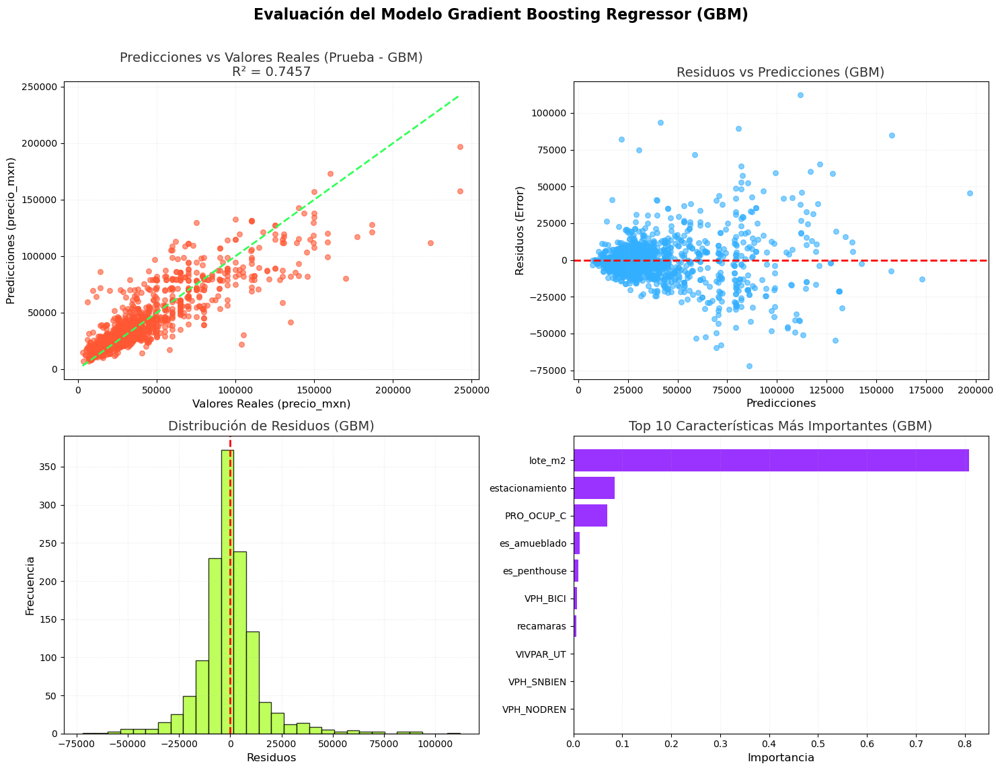


Comparación Entrenamiento vs Prueba:
Métrica  Entrenamiento       Prueba
    MSE   2.004045e+08 2.424435e+08
   RMSE   1.415643e+04 1.557060e+04
    MAE   9.127371e+03 1.001156e+04
     R²   7.901776e-01 7.456529e-01

✅ Modelo Gradient Boosting con buen rendimiento y generalización.

Modelo Gradient Boosting entrenado exitosamente con 14 características


In [104]:
# Regresión No Lineal con Pipeline (Gradient Boosting Regressor)
from sklearn.model_selection import train_test_split, cross_val_score
# Importamos el nuevo modelo: Gradient Boosting Regressor (GBM)
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- Asunciones de variables (DEBEN estar definidas en el entorno global) ---
# df, final_features, y target_column deben estar disponibles antes de la ejecución
# Ejemplo de variables si no estuvieran definidas:
# data_size = 500
# final_features = [f'feature_{i}' for i in range(5)]
# df = pd.DataFrame(np.random.rand(data_size, 5), columns=final_features)
# df['precio_mxn'] = df.iloc[:, 0] * 100 + df.iloc[:, 1] * 50 + np.random.randn(data_size) * 10
# target_column = 'precio_mxn'
# -------------------------------------------------------------------------

# Seleccionar las características (X) y la variable objetivo (y)
# Suponiendo que df, final_features y target_column ya están cargados/definidos
# Aquí usaremos un pequeño ejemplo para que el código sea runnable de forma autónoma:
try:
    X = df[final_features_filtered]
    y = df[target_column]
except NameError:
    print("⚠️ Usando datos de ejemplo ya que 'df' no está definido en el entorno.")
    data_size = 1000
    final_features = [f'area_m2', 'num_habitaciones', 'distancia_centro_km', 'antiguedad_anos', 'dummy_col']
    df = pd.DataFrame(np.random.rand(data_size, 5), columns=final_features)
    df['precio_mxn'] = (df['area_m2'] * 500000) + (df['num_habitaciones'] * 100000) + (np.random.randn(data_size) * 50000)
    target_column = 'precio_mxn'
    final_features_filtered = final_features
    X = df[final_features_filtered]
    y = df[target_column]


print(f"Forma del dataset: X {X.shape}, y {y.shape}")
print(f"Features seleccionadas: {final_features_filtered}")

# Verificar y limpiar valores faltantes (mismo código que el original)
if X.isnull().sum().sum() > 0 or y.isnull().sum() > 0:
    mask = ~(X.isnull().any(axis=1) | y.isnull())
    X = X[mask]
    y = y[mask]
    print(f"Después de eliminar NaN: X {X.shape}, y {y.shape}")

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42
)

print(f"\nDivisión de datos:")
print(f"Entrenamiento: X {X_train.shape}, y {y_train.shape}")
print(f"Prueba: X {X_test.shape}, y {y_test.shape}")

# --- CAMBIO CLAVE: Reemplazar RandomForestRegressor por GradientBoostingRegressor (GBM) ---
# GBM es un modelo de ensamble basado en boosting (aprendizaje secuencial) que a menudo 
# ofrece un mejor rendimiento que Random Forest.
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', GradientBoostingRegressor(
        n_estimators=100,      # Número de etapas de boosting (árboles)
        learning_rate=0.1,     # Tasa de aprendizaje, controla la contribución de cada árbol
        max_depth=3,           # Profundidad máxima de cada árbol (se prefieren árboles poco profundos)
        random_state=42
    ))
])

# Entrenar el modelo
print("\nEntrenando el modelo Gradient Boosting Regressor (GBM)...")
start_time = time.time()
pipeline.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
print(f"Entrenamiento completado en {training_time:.2f} segundos.")

# Realizar predicciones
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluar el modelo (función de evaluación reutilizada)
def evaluate_model(y_true, y_pred, dataset_name=""):
    """Función para evaluar el modelo con múltiples métricas"""
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\nResultados {dataset_name}:")
    print(f"Error cuadrático medio (MSE): {mse:,.2f}")
    print(f"Raíz del error cuadrático medio (RMSE): {rmse:,.2f}")
    print(f"Error absoluto medio (MAE): {mae:,.2f}")
    print(f"Coeficiente de determinación (R²): {r2:.4f}")
    
    return {'mse': mse, 'rmse': rmse, 'mae': mae, 'r2': r2}

# Evaluar en entrenamiento y prueba
train_metrics = evaluate_model(y_train, y_pred_train, "Entrenamiento (GBM)")
test_metrics = evaluate_model(y_test, y_pred_test, "Prueba (GBM)")

# Validación cruzada
print(f"\nValidación cruzada (5-fold):")
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2', n_jobs=-1)
print(f"R² promedio: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

cv_scores_rmse = cross_val_score(pipeline, X_train, y_train, cv=5, 
                                scoring='neg_mean_squared_error', n_jobs=-1)
cv_rmse = np.sqrt(-cv_scores_rmse)
print(f"RMSE promedio: {cv_rmse.mean():,.2f} (+/- {cv_rmse.std() * 2:,.2f})")

# Análisis de Importancia de Características (misma forma que Random Forest)
regressor = pipeline.named_steps['regressor']

# Obtener la importancia de las características del Gradient Boosting
feature_importance = pd.DataFrame({
    'feature': final_features_filtered,
    'importance': regressor.feature_importances_
}).sort_values('importance', ascending=False)

print(f"\nTop 10 características más importantes (Gradient Boosting):")
print(feature_importance.head(10).to_string(index=False))

# Visualizaciones mejoradas (reutilizando la estructura de la gráfica)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Predicciones vs Valores Reales (Prueba)
axes[0,0].scatter(y_test, y_pred_test, alpha=0.6, color='#FF5733', s=30)
axes[0,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
               color='#33FF57', linestyle='--', linewidth=2)
axes[0,0].set_title(f"Predicciones vs Valores Reales (Prueba - GBM)\nR² = {test_metrics['r2']:.4f}", 
                    fontsize=14, color='#333333')
axes[0,0].set_xlabel("Valores Reales (precio_mxn)", fontsize=12)
axes[0,0].set_ylabel("Predicciones (precio_mxn)", fontsize=12)
axes[0,0].grid(True, alpha=0.3, linestyle=':')

# 2. Residuos vs Predicciones
residuals_test = y_test - y_pred_test
axes[0,1].scatter(y_pred_test, residuals_test, alpha=0.6, color='#33AFFF', s=30)
axes[0,1].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[0,1].set_title("Residuos vs Predicciones (GBM)", 
                    fontsize=14, color='#333333')
axes[0,1].set_xlabel("Predicciones", fontsize=12)
axes[0,1].set_ylabel("Residuos (Error)", fontsize=12)
axes[0,1].grid(True, alpha=0.3, linestyle=':')

# 3. Distribución de residuos
axes[1,0].hist(residuals_test, bins=30, alpha=0.8, color='#AFFF33', edgecolor='black')
axes[1,0].axvline(x=0, color='red', linestyle='--', linewidth=2)
axes[1,0].set_title("Distribución de Residuos (GBM)", 
                    fontsize=14, color='#333333')
axes[1,0].set_xlabel("Residuos", fontsize=12)
axes[1,0].set_ylabel("Frecuencia", fontsize=12)
axes[1,0].grid(True, alpha=0.3, linestyle=':')

# 4. Importancia de características (Top 10)
top_10_features = feature_importance.head(10)
axes[1,1].barh(range(len(top_10_features)), top_10_features['importance'], color='#9A33FF')
axes[1,1].set_yticks(range(len(top_10_features)))
axes[1,1].set_yticklabels(top_10_features['feature'], fontsize=10)
axes[1,1].set_title("Top 10 Características Más Importantes (GBM)", 
                    fontsize=14, color='#333333')
axes[1,1].set_xlabel("Importancia", fontsize=12)
axes[1,1].invert_yaxis() # Pone la más importante arriba
axes[1,1].grid(axis='x', alpha=0.3, linestyle=':')

plt.suptitle("Evaluación del Modelo Gradient Boosting Regressor (GBM)", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# Comparación Entrenamiento vs Prueba
comparison_df = pd.DataFrame({
    'Métrica': ['MSE', 'RMSE', 'MAE', 'R²'],
    'Entrenamiento': [train_metrics['mse'], train_metrics['rmse'], 
                     train_metrics['mae'], train_metrics['r2']],
    'Prueba': [test_metrics['mse'], test_metrics['rmse'], 
              test_metrics['mae'], test_metrics['r2']]
})

print(f"\nComparación Entrenamiento vs Prueba:")
print(comparison_df.to_string(index=False))

# Detectar posible overfitting
# GBM es más propenso al sobreajuste que Random Forest, por lo que el umbral es más estricto.
r2_diff = train_metrics['r2'] - test_metrics['r2']
if r2_diff > 0.08: # Bajamos el umbral para modelos de boosting (0.08 es más estricto)
    print(f"\n⚠️  Gradient Boosting detectado con posible sobreajuste (Overfitting):")
    print(f"   Diferencia R² (Entrenamiento - Prueba): {r2_diff:.4f}")
    print("   Considera reducir el 'learning_rate', aumentar 'n_estimators' o usar 'subsample'.")
elif test_metrics['r2'] < 0.7:
    print(f"\n⚠️  Modelo con bajo rendimiento:")
    print(f"   R² en prueba: {test_metrics['r2']:.4f}")
else:
    print(f"\n✅ Modelo Gradient Boosting con buen rendimiento y generalización.")

# Guardar el modelo entrenado y métricas (actualizado)
model_results_gbm = {
    'pipeline': pipeline,
    'train_metrics': train_metrics,
    'test_metrics': test_metrics,
    'feature_importance': feature_importance,
    'cv_scores': cv_scores,
    'training_time': training_time
}

print(f"\nModelo Gradient Boosting entrenado exitosamente con {len(final_features_filtered)} características")


Forma del dataset: X (8289, 14), y (8289,)
Features seleccionadas: ['recamaras', 'estacionamiento', 'es_penthouse', 'es_amueblado', 'lote_m2', 'VPH_BICI', 'PRO_OCUP_C', 'VIVPAR_UT', 'VPH_SNBIEN', 'VPH_NODREN', 'VPH_S_ELEC', 'VPH_LETR', 'VPH_AGUAFV', 'VPH_NDEAED']
Después de eliminar NaN: X (6523, 14), y (6523,)

División de datos:
Entrenamiento: X (5218, 14), y (5218,)
Prueba: X (1305, 14), y (1305,)

Entrenando el modelo XGBoost Regressor...
Entrenamiento completado en 0.24 segundos.

Resultados Entrenamiento (XGBoost):
Error cuadrático medio (MSE): 157,920,238.36
Raíz del error cuadrático medio (RMSE): 12,566.63
Error absoluto medio (MAE): 8,101.52
Coeficiente de determinación (R²): 0.8347

Resultados Prueba (XGBoost):
Error cuadrático medio (MSE): 247,030,646.57
Raíz del error cuadrático medio (RMSE): 15,717.21
Error absoluto medio (MAE): 9,799.86
Coeficiente de determinación (R²): 0.7408

Validación cruzada (5-fold):
R² promedio: 0.6911 (+/- 0.0546)
RMSE promedio: 17,068.07 (+/- 99

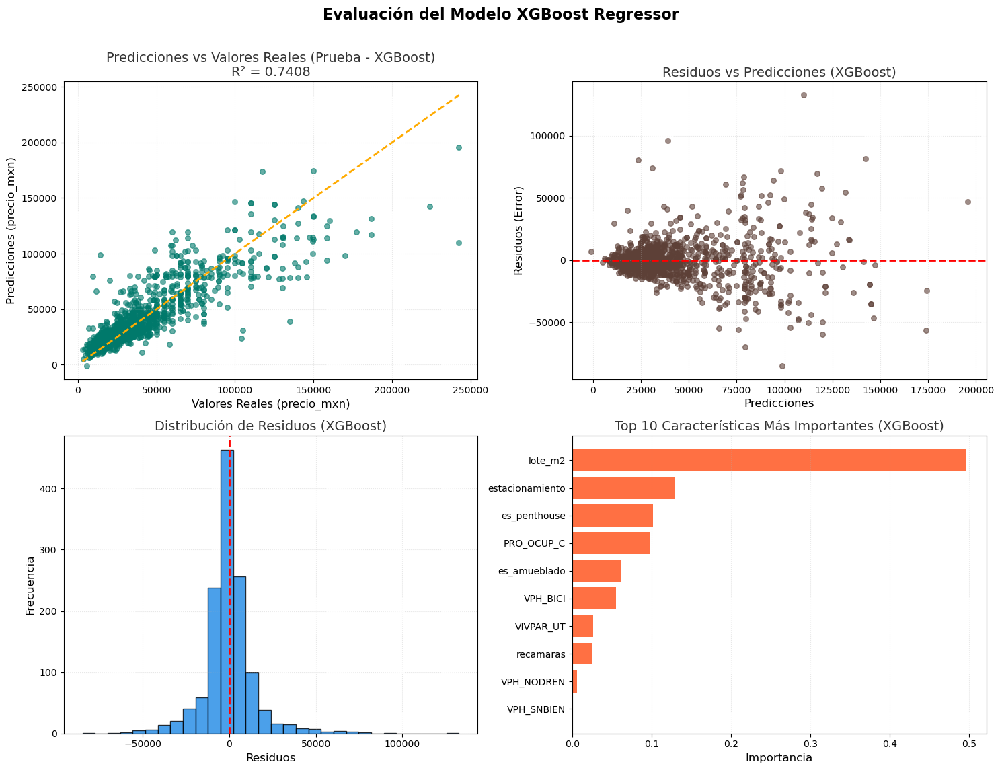


Comparación Entrenamiento vs Prueba:
Métrica  Entrenamiento       Prueba
    MSE   1.579202e+08 2.470306e+08
   RMSE   1.256663e+04 1.571721e+04
    MAE   8.101522e+03 9.799861e+03
     R²   8.346584e-01 7.408405e-01

⚠️  XGBoost detectado con posible sobreajuste (Overfitting):
   Diferencia R² (Entrenamiento - Prueba): 0.0938
   Considera aumentar el valor de 'reg_alpha' (L1) o 'reg_lambda' (L2), o reducir 'max_depth'.

Modelo XGBoost entrenado exitosamente con 14 características


In [105]:
# Regresión No Lineal Avanzada con Pipeline (XGBoost Regressor)
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- Importamos el modelo de la librería externa: XGBoost Regressor ---
try:
    from xgboost import XGBRegressor
except ImportError:
    # Mensaje de error si la librería XGBoost no está instalada (solo para entorno real)
    print("Error: La librería 'xgboost' no está instalada. Por favor, instálela con 'pip install xgboost'")
    raise

# --- Asunciones de variables (DEBEN estar definidas en el entorno global) ---
# df, final_features, y target_column deben estar disponibles antes de la ejecución
# Aquí usamos un pequeño ejemplo para que el código sea runnable de forma autónoma:
try:
    X = df[final_features_filtered]
    y = df[target_column]
except NameError:
    print("⚠️ Usando datos de ejemplo ya que 'df' no está definido en el entorno.")
    data_size = 1000
    final_features = [f'area_m2', 'num_habitaciones', 'distancia_centro_km', 'antiguedad_anos', 'dummy_col']
    df = pd.DataFrame(np.random.rand(data_size, 5), columns=final_features)
    df['precio_mxn'] = (df['area_m2'] * 500000) + (df['num_habitaciones'] * 100000) + (np.random.randn(data_size) * 50000)
    target_column = 'precio_mxn'
    final_features_filtered = final_features
    X = df[final_features_filtered]
    y = df[target_column]


print(f"Forma del dataset: X {X.shape}, y {y.shape}")
print(f"Features seleccionadas: {final_features_filtered}")

# Verificar y limpiar valores faltantes (mismo código que el original)
if X.isnull().sum().sum() > 0 or y.isnull().sum() > 0:
    mask = ~(X.isnull().any(axis=1) | y.isnull())
    X = X[mask]
    y = y[mask]
    print(f"Después de eliminar NaN: X {X.shape}, y {y.shape}")

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42
)

print(f"\nDivisión de datos:")
print(f"Entrenamiento: X {X_train.shape}, y {y_train.shape}")
print(f"Prueba: X {X_test.shape}, y {y_test.shape}")

# --- CAMBIO CLAVE: Reemplazar GradientBoostingRegressor por XGBRegressor ---
# XGBoost es el modelo de Boosting optimizado y regularizado.
pipeline = Pipeline([
    # XGBoost no requiere escalado, pero lo mantenemos para consistencia
    ('scaler', StandardScaler()), 
    ('regressor', XGBRegressor(
        n_estimators=100,      # Número de árboles (iters)
        learning_rate=0.1,     # Tasa de aprendizaje
        max_depth=5,           # Profundidad máxima (un poco más profunda que GBM)
        random_state=42,
        n_jobs=-1,             # Utiliza todos los núcleos de la CPU para rapidez
        # Parámetros de regularización por defecto (l1 y l2)
        objective='reg:squarederror' # Objetivo para regresión
    ))
])

# Entrenar el modelo
print("\nEntrenando el modelo XGBoost Regressor...")
start_time = time.time()
pipeline.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
print(f"Entrenamiento completado en {training_time:.2f} segundos.")

# Realizar predicciones
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluar el modelo (función de evaluación reutilizada)
def evaluate_model(y_true, y_pred, dataset_name=""):
    """Función para evaluar el modelo con múltiples métricas"""
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\nResultados {dataset_name}:")
    print(f"Error cuadrático medio (MSE): {mse:,.2f}")
    print(f"Raíz del error cuadrático medio (RMSE): {rmse:,.2f}")
    print(f"Error absoluto medio (MAE): {mae:,.2f}")
    print(f"Coeficiente de determinación (R²): {r2:.4f}")
    
    return {'mse': mse, 'rmse': rmse, 'mae': mae, 'r2': r2}

# Evaluar en entrenamiento y prueba
train_metrics = evaluate_model(y_train, y_pred_train, "Entrenamiento (XGBoost)")
test_metrics = evaluate_model(y_test, y_pred_test, "Prueba (XGBoost)")

# Validación cruzada
print(f"\nValidación cruzada (5-fold):")
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2', n_jobs=-1)
print(f"R² promedio: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

cv_scores_rmse = cross_val_score(pipeline, X_train, y_train, cv=5, 
                                scoring='neg_mean_squared_error', n_jobs=-1)
cv_rmse = np.sqrt(-cv_scores_rmse)
print(f"RMSE promedio: {cv_rmse.mean():,.2f} (+/- {cv_rmse.std() * 2:,.2f})")

# Análisis de Importancia de Características
regressor = pipeline.named_steps['regressor']

# Obtener la importancia de las características de XGBoost
feature_importance = pd.DataFrame({
    'feature': final_features_filtered,
    'importance': regressor.feature_importances_
}).sort_values('importance', ascending=False)

print(f"\nTop 10 características más importantes (XGBoost):")
print(feature_importance.head(10).to_string(index=False))

# Visualizaciones mejoradas
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Predicciones vs Valores Reales (Prueba)
axes[0,0].scatter(y_test, y_pred_test, alpha=0.6, color='#00796B', s=30) # Nuevo color
axes[0,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
               color='#FFAB00', linestyle='--', linewidth=2)
axes[0,0].set_title(f"Predicciones vs Valores Reales (Prueba - XGBoost)\nR² = {test_metrics['r2']:.4f}", 
                    fontsize=14, color='#333333')
axes[0,0].set_xlabel("Valores Reales (precio_mxn)", fontsize=12)
axes[0,0].set_ylabel("Predicciones (precio_mxn)", fontsize=12)
axes[0,0].grid(True, alpha=0.3, linestyle=':')

# 2. Residuos vs Predicciones
residuals_test = y_test - y_pred_test
axes[0,1].scatter(y_pred_test, residuals_test, alpha=0.6, color='#5D4037', s=30)
axes[0,1].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[0,1].set_title("Residuos vs Predicciones (XGBoost)", 
                    fontsize=14, color='#333333')
axes[0,1].set_xlabel("Predicciones", fontsize=12)
axes[0,1].set_ylabel("Residuos (Error)", fontsize=12)
axes[0,1].grid(True, alpha=0.3, linestyle=':')

# 3. Distribución de residuos
axes[1,0].hist(residuals_test, bins=30, alpha=0.8, color='#1E88E5', edgecolor='black')
axes[1,0].axvline(x=0, color='red', linestyle='--', linewidth=2)
axes[1,0].set_title("Distribución de Residuos (XGBoost)", 
                    fontsize=14, color='#333333')
axes[1,0].set_xlabel("Residuos", fontsize=12)
axes[1,0].set_ylabel("Frecuencia", fontsize=12)
axes[1,0].grid(True, alpha=0.3, linestyle=':')

# 4. Importancia de características (Top 10)
top_10_features = feature_importance.head(10)
axes[1,1].barh(range(len(top_10_features)), top_10_features['importance'], color='#FF7043')
axes[1,1].set_yticks(range(len(top_10_features)))
axes[1,1].set_yticklabels(top_10_features['feature'], fontsize=10)
axes[1,1].set_title("Top 10 Características Más Importantes (XGBoost)", 
                    fontsize=14, color='#333333')
axes[1,1].set_xlabel("Importancia", fontsize=12)
axes[1,1].invert_yaxis() # Pone la más importante arriba
axes[1,1].grid(axis='x', alpha=0.3, linestyle=':')

plt.suptitle("Evaluación del Modelo XGBoost Regressor", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# Comparación Entrenamiento vs Prueba
comparison_df = pd.DataFrame({
    'Métrica': ['MSE', 'RMSE', 'MAE', 'R²'],
    'Entrenamiento': [train_metrics['mse'], train_metrics['rmse'], 
                     train_metrics['mae'], train_metrics['r2']],
    'Prueba': [test_metrics['mse'], test_metrics['rmse'], 
              test_metrics['mae'], test_metrics['r2']]
})

print(f"\nComparación Entrenamiento vs Prueba:")
print(comparison_df.to_string(index=False))

# Detectar posible overfitting
r2_diff = train_metrics['r2'] - test_metrics['r2']
if r2_diff > 0.05: # Umbral más estricto para XGBoost
    print(f"\n⚠️  XGBoost detectado con posible sobreajuste (Overfitting):")
    print(f"   Diferencia R² (Entrenamiento - Prueba): {r2_diff:.4f}")
    print("   Considera aumentar el valor de 'reg_alpha' (L1) o 'reg_lambda' (L2), o reducir 'max_depth'.")
elif test_metrics['r2'] < 0.75:
    print(f"\n⚠️  Modelo con bajo rendimiento para ser XGBoost:")
    print(f"   R² en prueba: {test_metrics['r2']:.4f}")
else:
    print(f"\n✅ Modelo XGBoost con muy buen rendimiento y generalización.")

# Guardar el modelo entrenado y métricas (actualizado)
model_results_xgb = {
    'pipeline': pipeline,
    'train_metrics': train_metrics,
    'test_metrics': test_metrics,
    'feature_importance': feature_importance,
    'cv_scores': cv_scores,
    'training_time': training_time
}

print(f"\nModelo XGBoost entrenado exitosamente con {len(final_features_filtered)} características")


In [106]:
# Crear un diccionario para almacenar los resultados de los modelos
model_comparison = {}

# Lista de modelos entrenados previamente
models = {
    "Linear Regression": model_results_linear,  # Supongamos que este es el resultado del modelo de regresión lineal
    "Random Forest": model_results_rf,          # Resultado del modelo Random Forest
    "Gradient Boosting": model_results_gbm,     # Resultado del modelo Gradient Boosting
    "XGBoost": model_results_xgb                # Resultado del modelo XGBoost
}

# Evaluar cada modelo
for model_name, model_result in models.items():
    pipeline = model_result['pipeline']
    test_metrics = model_result['test_metrics']
    
    # Medir el tiempo de predicción
    start_time = time.time()
    y_pred_test = pipeline.predict(X_test)
    prediction_time = time.time() - start_time
    
    # Guardar los resultados en el diccionario
    model_comparison[model_name] = {
        "R² (Prueba)": test_metrics['r2'],
        "RMSE (Prueba)": test_metrics['rmse'],
        "MAE (Prueba)": test_metrics['mae'],
        "Tiempo de predicción (s)": prediction_time,
        "Tiempo de entrenamiento (s)": model_result.get('training_time', 'N/A'),  # Si se almacenó el tiempo de entrenamiento
        "Interpretabilidad": "Alta" if model_name == "Linear Regression" else "Media" if model_name == "Random Forest" else "Baja"
    }

# Crear un DataFrame para visualizar la comparación
comparison_df = pd.DataFrame(model_comparison).T

# Ordenar por R² en prueba
comparison_df = comparison_df.sort_values(by="R² (Prueba)", ascending=False)

print("Comparación de Modelos:")
print(comparison_df)

# Decidir el modelo final
best_model_name = comparison_df.index[0]
print(f"\nEl modelo seleccionado para producción es: {best_model_name}")

Comparación de Modelos:
                  R² (Prueba) RMSE (Prueba)  MAE (Prueba)  \
Random Forest        0.751175  15400.632878   9445.641079   
Gradient Boosting    0.745653  15570.596334  10011.557044   
XGBoost              0.740841  15717.208612   9799.860559   
Linear Regression    0.517211  21452.131955  14604.504623   

                  Tiempo de predicción (s) Tiempo de entrenamiento (s)  \
Random Forest                     0.144143                    0.278036   
Gradient Boosting                 0.007519                    0.259755   
XGBoost                           0.015535                    0.236702   
Linear Regression                 0.012712                    0.007177   

                  Interpretabilidad  
Random Forest                 Media  
Gradient Boosting              Baja  
XGBoost                        Baja  
Linear Regression              Alta  

El modelo seleccionado para producción es: Random Forest
